# Task

Senior Data Scientist - Risk Modeling homework assignment

Using the provided historical data set, build a model predicting damage to buildings from future wildfires. Feel free to make any reasonable assumptions about the features you use or discard, but be sure to document them. Please provide your process, results, and comments in a Jupyter notebook.
What we are looking for in the deliverable:  
● Commentary of your process (thoughtfulness is weighed more heavily than model  
validation metrics)  
● Exploration of the data set  
● Training of a model predicting structural damage  
● Model evaluation  
● Potential shortcomings of the data set, the model built, and what you’d like to consider
next  

# Solution overview
Below is a short description of the solution workflow:
1. Load and Explore data (understand columns, exclude irrelevant columns, select a dependent variable, get data insights)
2. Prepare data (clean selected columns, create new features based on neighbor buildings properties)
3. Develop and test a multiclass classification models (try different approaches, test model using a holdout sample, interpret the resulted model, select thresholds)
4. Develop an alternative model using one-VS-rest approach 
5. Conclusion and the next steps

See below for details on each step.

# Import libraries

In [1]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

import tensorflow_data_validation as tfdv
from sklearn.metrics import DistanceMetric
from geopy import distance
from tqdm.notebook import tqdm
import os

from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report, precision_recall_curve
from sklearn.metrics import balanced_accuracy_score, accuracy_score, precision_score, recall_score, f1_score

from sklearn.utils.class_weight import compute_sample_weight
from sklearn.model_selection import train_test_split

import shap
import xgboost as xgb

2023-03-20 11:13:30.457663: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Data loading

In [2]:
df = pd.read_csv('Data.csv')
print(df.shape)
df.head(3)

(31684, 31)


,DAMAGE,STREETNUMB,STREETNAME,STREETTYPE,STREETSUFF,CITY,STATE,CALFIREUNI,COUNTY,COMMUNITY,INCIDENTNA,INCIDENTNU,INCIDENTST,HAZARDTYPE,VEGCLEARAN,STRUCTURET,ROOFCONSTR,EAVES,VENTSCREEN,EXTERIORSI,WINDOWPANE,TOPOGRAPHY,APN,ASSESSEDIM,YEARBUILT,SITEADDRES,GLOBALID,GEOMETRY,LONGITUDE,LATITUDE,CLAIM
0,Destroyed (>50%),1480,Patrick,Drive,154,Paradise Northwest A,CA,BTU,Butte,Paradise,Camp,CA-BTU-016737,11/8/2018,Fire,0-30',Mobile Home Double Wide,Asphalt,Unknown,"Mesh Screen > 1/8""",Ignition Resistant,Single Pane,Flat Ground,050-150-111-000,2756731,1900.0,1400 KILCREASE CIR PARADISE CA 95969,{44673E14-1CA5-4AE5-BAD2-FBB23CEE6E17},POINT (-121.5905677572311 39.7826496849055),-121.590568,39.782650,629141.49
1,Destroyed (>50%),1480,Patrick,Drive,156,Paradise Northwest A,CA,BTU,Butte,Paradise,Camp,CA-BTU-016737,11/8/2018,Fire,0-30',Mobile Home Double Wide,Asphalt,Unknown,"Mesh Screen > 1/8""",Ignition Resistant,Multi Pane,Flat Ground,050-150-111-000,2756731,1900.0,1400 KILCREASE CIR PARADISE CA 95969,{0D5163EE-231B-43C6-8B61-FF7301765CAE},POINT (-121.5903517061171 39.78267012986168),-121.590352,39.782670,812980.07
2,Destroyed (>50%),1480,Patrick,Drive,158,Paradise Northwest A,CA,BTU,Butte,Paradise,Camp,CA-BTU-016737,11/8/2018,Fire,0-30',Mobile Home Double Wide,Asphalt,Unknown,"Mesh Screen > 1/8""",Ignition Resistant,Multi Pane,Flat Ground,050-150-111-000,2756731,1900.0,1400 KILCREASE CIR PARADISE CA 95969,{316A2D22-D5CE-4FFD-BE9A-A39485DD7FC3},POINT (-121.5901607359658 39.78265522691407),-121.590161,39.782655,349805.49


We have a table with 31684 rows and 31 columns. Let's find and explore data.

# Data Exploration

We have a lot of ‘Unknown’ values in DF. Let's first replace them with None values and then start our exploration. (There is an opinion to keep "Unknown" values as a special category, different from the None values. But I think that in our case there is no significant information in the "Unknown" flag, and models, especially complex ones, can overfit).

In [3]:
# replace 'Unknown' values to None
n_unk1 = (df == 'Unknown').sum().sum()
df.replace({'Unknown':np.nan}, inplace= True)
n_unk2 = (df == 'Unknown').sum().sum()
print(f'{n_unk1} -> {n_unk2}')
print(f'We had {n_unk1} unknown values over all DF -> Now we have {n_unk2} unknown values')
assert n_unk2 == 0, 'Does not replace all Unknown values'
del n_unk1, n_unk2

33703 -> 0
We had 33703 unknown values over all DF -> Now we have 0 unknown values


## Visualize dataset statistics

Let's use tensorflow_data_validation tool to explore features types, distributions, number of empty values, and get some useful insights from our data.

In [4]:
print('Table_1')

# Generate dataset statistics
general_stats = tfdv.generate_statistics_from_dataframe(df)

# Visualize dataset statistics
tfdv.visualize_statistics(general_stats)

Table_1


## Assumptions about the features

At this point, we have the names of the columns and distributions, and we can also look at the raw data in the Table_1. So, we have enough information to make assumptions about the meaning of features.
Below is information on how I understand each feature, whether I will consider it to use in the model (OK / DROP), what kind of feature it is at a high level (GEO - about the address or geo-information, House Type - the property of the house , Tech field - some technical information, etc.)


1. STREETNUMB - Street number - Not informative for our model, other features with location will be used - DROP - GEO
2. STREETNAME - Street name - Some information can be extracted from this feature about surroundings of the building. For instance, name "Burning Tree" gives us an idea about that the house can be surround by trees. However it is better to find coordinates of nearest lakes, forests and other places and calculate distances between them and building. In this way we will have more stable results because street names can be renamed or lose their meaning during the time.  - DROP - GEO
3. STREETTYPE - Can be useful and classified as house type, we need to clean this column - OK - House type
4. STREETSUFF - Street suffix - Not informative for our model, other features with location will be used - DROP - GEO
5. CITY - CITY NAME - Can be useful, there are some small freq values which can be combined together - OK - GEO
6. STATE - STATE NAME - Constant feature we have only CA (and one C) - DROP - GEO
7. CALFIREUNI - Can be useful (this is County fire unit - https://www.fire.ca.gov/) perhaps different fire units work differently - OK - Fire_unit
8. COUNTY - Can be useful - OK - GEO
9. COMMUNITY - Can be useful, may be we need combine with COUNTY to avoid same community names - OK 
10. INCIDENTNA - Looks like fire name (https://en.wikipedia.org/wiki/Tubbs_Fire). During the model inference we won't have this feature and it can not be used in feature gen - DROP
11. INCIDENTNU - Looks like incedent number. Similar meaning as prev column - DROP
12. INCIDENTST - Date of incident. Also we do not need date of incedent in our model - DROP
13. HAZARDTYPE - Hazard type - Constant value, we have only fires - DROP
14. VEGCLEARAN - Vegetation clearance means the minimum separation in air that must be maintained between vegetation and live electrical, we need to clean this column - OK - House type
15. STRUCTURET - Building type, some small classes can be combined, we need to clean this column - OK - House type
16. ROOFCONSTR - Roof type - OK - House type   
17. EAVES - Roof part type - OK - House type
18. VENTSCREEN - This is type of piece of ventilation, we need to clean this column - OK - House type
19. EXTERIORSI - Type of house exterior in terms of fire resistance - OK - House type
20. WINDOWPANE - Window pane type - OK - House type
21. TOPOGRAPHY - Type of landscape, can be considered as house type - OK - House type
22. APN - Accsess point name (?) 20k unique values - DROP - Tech field
23. ASSESSEDIM - ?;
24. YEARBUILT -  23% of missing values, which is a lot. This feature is expected to be important, so missing values should be well treated. Also, there are 0 values and there might be unrealistic values - all these cases should be replaced.
25. SITEADDRES - Also address (does not match first one) more than 20k unique values - DROP - GEO
26. GLOBALID - All unique values, this is id - DROP - Unknown
27. GEOMETRY - Coordinates, may be usefull to calculate distances to fire station, wood, lake ect. To do this, we need external information 
28. LONGITUDE - Coordinate, may be usefull to calculate distances to fire station, wood, lake ect. To do this, we need external information 
29. LATITUDE - Coordinate, may be usefull to calculate distances to fire station, wood, lake ect. To do this, we need external information
30. CLAIM - Policy claim - DROP 

## Choose a target column. DAMAGE VS CLAIM
There are two columns that can be considered as our target: DAMAGE and CLAIM. Below is a comparison and the selection between these two possible targets.

###  DAMAGE field

From Table_1 we can see that DAMAGE column has similar values explained with percents and words. 
According to the source: https://gis.data.ca.gov/datasets/1b1c428af1f74a8c912f4b5c9e40d51e/about we can combine these values and put them into the new column which I called DAMAGE_CLASS.  

1-9%	Affected Damage  
10-25%	Minor Damage  
26-50%	Major Damage  
51-100%	Destroyed  
No Damage	No Damage

In [5]:
def fix_classes_names(class_name:str, di:dict):
    ''''''
    return di.get(class_name) if class_name in di.keys() else class_name

In [6]:
# check that we have only 1 column with sub string damage:
dmg_clmns = [dc for dc in df.columns if re.match('damage',dc.lower())] # 
assert len(dmg_clmns) == 1, 'There are more than one column with info about damage'
print(f'Columns which have word damage in their names: {dmg_clmns}')
del dmg_clmns

Columns which have word damage in their names: ['DAMAGE']


In [7]:
print(f'Number of unique values in DAMAGE field:{df.DAMAGE.nunique()}\n')

print('Creating a dict with fixed class names..')
class_name_di = {
    '1-9%':'Affected (1-9%)',
    '10-25%':'Minor (10-25%)', 
    '26-50%':'Major (26-50%)',
    '51-75%':'Destroyed (>50%)',
    'Destroyed':'Destroyed (>50%)'
}

df['DAMAGE_CLASS'] = df.DAMAGE.apply(lambda x: fix_classes_names(x, class_name_di))
assert df['DAMAGE_CLASS'].nunique() == len(class_name_di), 'Wrong number of classes'

print(f'Number of unique values in new column DAMAGE_CLASS with combined values:{df.DAMAGE_CLASS.nunique()}')
print(f'Fixed classes names dist:\n{round(df["DAMAGE_CLASS"].value_counts(normalize=True) * 100,1)}')

Number of unique values in DAMAGE field:10

Creating a dict with fixed class names..
Number of unique values in new column DAMAGE_CLASS with combined values:5
Fixed classes names dist:
Destroyed (>50%)    92.7
Affected (1-9%)      4.0
No Damage            1.8
Minor (10-25%)       1.0
Major (26-50%)       0.5
Name: DAMAGE_CLASS, dtype: float64


We can see that DAMAGE_CLASS is higly imbalanced: 92.7% of buildings were destroyed, only half of percent have Major destroy and only 1.8% have no damage.

### CLAIM field

In [8]:
def feature_dist_by_cat_df(df, feature:str, cat_feature:str):
    ''''''
    dfs_li = []
    for cf in df[cat_feature].unique():
        cur_df = pd.DataFrame(df[df[cat_feature] == cf][feature].describe())
        cur_df.columns = [f'{cf}_dist']
        dfs_li.append(cur_df)
    return pd.concat(dfs_li, axis=1)

CLAIM distribution over DAMAGE_CLASS


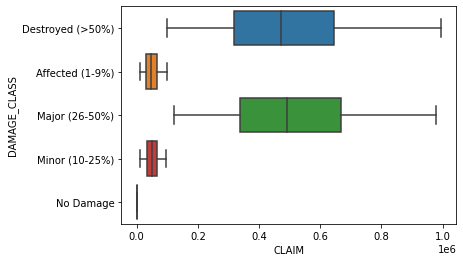

,Destroyed (>50%)_dist,Affected (1-9%)_dist,Major (26-50%)_dist,Minor (10-25%)_dist,No Damage_dist
count,29383.000000,1256.000000,160.000000,310.000000,575.0
mean,486431.634626,48709.772142,500937.302938,50993.164645,0.0
std,210617.181876,21480.794006,215469.996964,20622.852728,0.0
min,100522.360000,10046.340000,122100.320000,10821.910000,0.0
25%,316829.340000,30945.887500,338175.990000,34083.902500,0.0
50%,470675.680000,47238.215000,492968.320000,50836.965000,0.0
75%,646725.615000,64997.265000,666739.672500,66097.462500,0.0
max,995255.530000,98767.940000,977909.160000,97351.350000,0.0


In [9]:
print('CLAIM distribution over DAMAGE_CLASS')

sns.boxplot(data= df, x= "CLAIM", y="DAMAGE_CLASS")
plt.show()

cliam_dmg_df = feature_dist_by_cat_df(df, 'CLAIM', 'DAMAGE_CLASS')
cliam_dmg_df

If we consider CLAIM distribution over DAMAGE_CLASS, we can see that:
1. When there is no damage, the claim is equal to zero. As for Affected/Minor damage, we have a median CLAIM value in thousands. For higher damage, we have claim value in hundreds of thousands. Thus, the median CLAIM value increases with damage level.
2. For Major and Destroyed categories, distributions are very close to each other and the maximum value is ~1 millon.

From Table_1 we know the distribution of feature STRUCTURET that describes a building type. Let's look at CLAIM and DAMAGE_CLASS for different types of building (I checked the distributions for all building types but to save space in the notebook, let's look only at two of them).

Home type: Mobile Home Single Wide


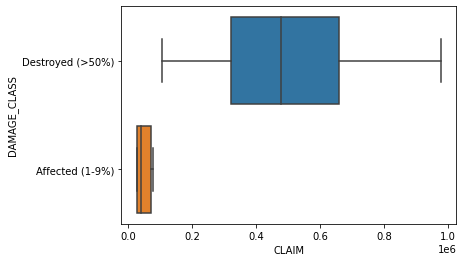

Home type: Single Family Residence Single Story


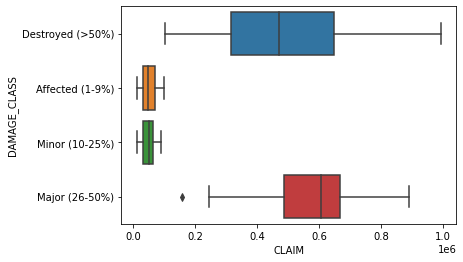

In [10]:
dist_li = []
home_types = ['Mobile Home Single Wide', 'Single Family Residence Single Story']
for bt in home_types:
    print(f'Home type: {bt}')
    sns.boxplot(data= df[df.STRUCTURET == bt], x= "CLAIM", y="DAMAGE_CLASS")
    plt.show()
    dist_li.append(df[df.STRUCTURET == bt].CLAIM.describe())
tdf = pd.DataFrame(dist_li).T
tdf.columns = home_types
del dist_li

In [11]:
tdf

,Mobile Home Single Wide,Single Family Residence Single Story
count,891.000000,9232.000000
mean,489914.459540,466571.912036
std,218671.864629,224172.255565
min,26602.880000,10673.450000
25%,317108.460000,292433.262500
50%,476045.670000,456890.100000
75%,658555.475000,640010.090000
max,977608.320000,993881.730000


In [12]:
del tdf

Thus, we see that the median CLAIM for a mobile home is higher than for a single-family home, which is strange because Mobile homes are cheaper than single-family buildings (https://www.forbes.com/advisor/mortgages/mobile-home-cost/). Also, we have a maximum value of CLAIM = ~1M for any type of house and any damage.

### Decision

On the one hand, DAMAGE_CLASS can be considered as a target. However, we have a significant gap in DAMAGE_CLASS - 4 categories under 50% of damage and the only one category with more than 50% of damage Moreover, as far as I understood, these categories are provided from fire departments but not from insurance companies.

On the other hand, CLAIM field can be a target. The meaning of CLAIM field looks like an insurance claim because when there is no damage, all CLAIM values are equal to zero. At the same time, the maximum CLAIM value is too small for California (~1M) and does not depend on the type of building (see the example with mobile houses). According to the internet, there is no restrictions on the maximum claim for wildfire.

Let's consider DAMAGE_CLASS as a dependent variable that we want to predict because the drawbacks of CLAIM as a target column outweigh the ones of DAMAGE_CLASS.

P.S. We can also train two different models. But we will have the same features in both cases. The difference will be only in the model type: regression or multiclass classification.

## ASSESSEDIM

Let's look at ASSESSEDIM closely and try to understand this field.

In [13]:
print('Distribution ASSESSEDIM over STRUCTURET')
ass_str_df = feature_dist_by_cat_df(df, feature= 'ASSESSEDIM', cat_feature= 'STRUCTURET')
ass_str_df

Distribution ASSESSEDIM over STRUCTURET


,Mobile Home Double Wide_dist,Single Family Residence Single Story_dist,UtilityMiscStructure_dist,Mobile Home Single Wide_dist,Commercial Building Single Story_dist,Multi Family Residence Single Story_dist,Mobile Home Triple Wide_dist,School_dist,Single Family Residence Multi Story_dist,Motor Home_dist,Mixed Commercial/Residential_dist,Commercial Building Multi Story_dist,Church_dist,Multi Family Residence Multi Story_dist,Infrastructure_dist,Single Family Residence-Single Story_dist,Single Family Residence-Multi Story_dist,Outbuilding gt 10'X12'_dist,Non-habitable-Detached Garage_dist,Multi Family Residence - Multi Story_dist,Multi Family Residence - Single Story_dist,Non-habitable-Shop_dist,Commercial Building - Multi Story_dist,Non-habitable-Barn_dist,nan_dist,Commercial Building - Single Story_dist,Miscellaneous_dist,Mobile Home - Single Wide_dist,Mobile Home - Motor Home_dist,Mobile Home - Double Wide_dist,Mobile Home - Triple Wide_dist,Hospital_dist
count,2.807000e+03,9.232000e+03,4.845000e+03,8.910000e+02,5.870000e+02,2.460000e+02,2.310000e+02,1.150000e+02,2.329000e+03,1.310000e+02,18.000000,7.200000e+01,2.300000e+01,7.000000e+01,1.300000e+01,3.037000e+03,3.398000e+03,1.191000e+03,6.840000e+02,9.900000e+01,1.040000e+02,5.760000e+02,3.900000e+01,2.440000e+02,0.0,1.330000e+02,11.000000,2.310000e+02,29.000000,2.660000e+02,28.000000,2.000000e+00
mean,4.954027e+05,1.444190e+05,1.524722e+05,5.233564e+05,1.206860e+06,1.063604e+06,3.385711e+05,1.894599e+06,2.968618e+05,3.893487e+05,120165.000000,3.014484e+06,9.233725e+05,1.773298e+06,1.342059e+07,3.882289e+05,5.271436e+05,5.503517e+05,5.786069e+05,2.796546e+06,1.439058e+06,5.134016e+05,1.022162e+07,5.580625e+05,NaN,7.738290e+06,319025.545455,1.784215e+05,139059.206897,2.110388e+06,164664.000000,6.836048e+06
std,7.922638e+05,1.610092e+05,2.783825e+05,6.800156e+05,5.973976e+06,2.159170e+06,6.302538e+05,2.953056e+06,3.828055e+05,6.026155e+05,78249.452814,1.083246e+07,9.403317e+05,5.921638e+06,4.637536e+07,1.431892e+06,7.644977e+05,1.437358e+06,1.021694e+06,1.085564e+07,2.108537e+06,1.102391e+06,2.680449e+07,8.925583e+05,NaN,2.875103e+07,319227.399559,5.393178e+05,156937.469730,3.330615e+06,151409.281681,9.093320e+06
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.773000e+03,0.000000e+00,0.000000e+00,0.000000e+00,12246.000000,0.000000e+00,9.943900e+04,5.202000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.221480e+05,0.000000e+00,NaN,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,4840.000000,4.061000e+05
25%,1.823300e+04,7.263625e+04,4.500000e+04,1.514050e+04,6.958900e+04,1.268070e+05,3.663350e+04,0.000000e+00,1.240180e+05,2.261300e+04,47699.250000,1.480578e+05,1.972110e+05,1.154715e+05,1.387200e+05,1.246380e+05,2.285768e+05,1.026060e+05,1.340265e+05,2.622860e+05,1.509862e+05,9.563875e+04,1.645948e+06,1.336442e+05,NaN,1.554650e+05,80189.000000,2.055100e+04,0.000000,2.055100e+04,34983.000000,3.621074e+06
50%,6.798600e+04,1.136350e+05,9.642600e+04,1.857850e+05,1.731870e+05,3.250065e+05,9.363600e+04,0.000000e+00,2.026760e+05,1.103890e+05,112479.000000,3.271595e+05,6.033800e+05,2.903875e+05,2.186700e+05,2.202240e+05,3.936455e+05,2.164510e+05,2.766405e+05,3.207230e+05,3.278265e+05,2.297080e+05,3.224478e+06,3.016700e+05,NaN,7.917070e+05,170000.000000,2.055100e+04,112000.000000,8.700050e+04,124026.000000,6.836048e+06
75%,6.903780e+05,1.707542e+05,1.690310e+05,7.657580e+05,4.733225e+05,9.866290e+05,2.014445e+05,2.789228e+06,3.182600e+05,5.398020e+05,204000.000000,8.287995e+05,1.210784e+06,7.650660e+05,5.629900e+05,3.670470e+05,6.199890e+05,4.807125e+05,5.728920e+05,4.150000e+05,2.932828e+06,5.024028e+05,8.441490e+06,6.411388e+05,NaN,2.673238e+06,561267.500000,1.419685e+05,244686.000000,7.562995e+06,250426.500000,1.005102e+07
max,2.756731e+06,4.772836e+06,4.912852e+06,2.756731e+06,5.425339e+07,1.202054e+07,2.756731e+06,7.509416e+06,6.761301e+06,4.659997e+06,205000.000000,5.425339e+07

It could be related to the building size, as we have larger values for Commercial Buildings. And the 'Mobile Home Triple' type shows greater values than the 'Mobile Home Double' type   

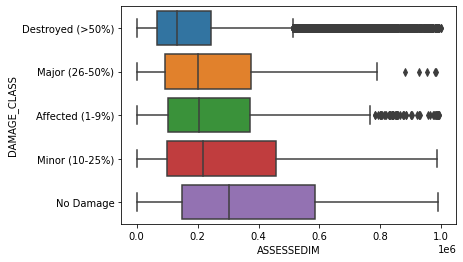

In [14]:
sns.boxplot(data=df[df.ASSESSEDIM < 1_000_000], x="ASSESSEDIM", y="DAMAGE_CLASS")
plt.show()

In [15]:
# Dist ASSESSEDIM in turms of DAMAGE_CLASS
tdf = pd.concat(
    [df[df.DAMAGE_CLASS == dc].ASSESSEDIM.describe() for dc in df.DAMAGE_CLASS.unique()], axis=1)
tdf.columns = df.DAMAGE_CLASS.unique()
tdf

,Destroyed (>50%),Affected (1-9%),Major (26-50%),Minor (10-25%),No Damage
count,2.938300e+04,1.256000e+03,1.600000e+02,3.100000e+02,5.750000e+02
mean,3.533871e+05,7.306309e+05,1.282717e+06,3.904921e+06,1.210564e+06
std,1.577302e+06,2.621360e+06,5.857731e+06,2.191337e+07,2.559392e+06
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,7.007000e+04,1.134472e+05,1.185030e+05,1.171620e+05,2.204395e+05
50%,1.409250e+05,2.437970e+05,2.442660e+05,2.796030e+05,4.993850e+05
75%,2.872160e+05,5.593805e+05,5.442500e+05,6.154910e+05,1.070000e+06
max,1.677310e+08,5.425339e+07,7.138781e+07,1.677310e+08,1.756682e+07


I'm not sure about the meaning of ASSESSEDIM, so we'll exclude it from the further analysis.

## Color Map for all samples

Distributions of our features can provide some important information that can be used in the modeling part. Before moving further, let's have a look on our data on California map.
Below I plot a scatter plot using buildings coordinates. DAMAGE_CLASS  is transformed into DAMAGE_COLOR. And information about DAMAGE_CLASS, STRUCTURET, INCIDENTNA for every data point is provided.

In [16]:
color_di = {
    'No Damage': 'green',
    'Affected (1-9%)' : 'yellow',
    'Minor (10-25%)':'orange',
    'Major (26-50%)':'red',
    'Destroyed (>50%)':'purple'
}

df['DAMAGE_COLOR'] = df.DAMAGE_CLASS.apply(
    lambda x: fix_classes_names(x, color_di))

print(df['DAMAGE_COLOR'].value_counts())

purple    29383
yellow     1256
green       575
orange      310
red         160
Name: DAMAGE_COLOR, dtype: int64


In [17]:
import plotly.express as px

fig = px.scatter_mapbox(
    df,
    lat="LATITUDE",
    lon="LONGITUDE",
    hover_data=["DAMAGE", "STRUCTURET", 'INCIDENTNA'],
    color_discrete_sequence = [df.DAMAGE_COLOR],
    zoom=6,
    height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

This is an interactive map and you can zoom in to see specific building damage from a specific fire. Insights from the map:
1. We can see separate clusters of buildings with different DAMAGE_CLASS in different places.
2. DAMAGE_CLASS is not distributed uniformly across incidents. For instance, there are many buildings with no damage in Atlas fire and zero no damaged buildings in Redwood or Woolsey fires.
3. In Atlas non damaged clusters of buildings can be noticed. It looks like these houses stand out among damaged buildings.
4. At the same time, there are buildings that are far away from other buildings but they are damaged.
5. There are really close buildings with the same/different STRUCTURET type and same/different DAMAGE_CLASS. So all combinations are possible.

# Data Insights & Model Design

At this point, we explored and validated data and selected the target. But before we generate features and train models,  let's design our model and discuss its inference.

According to the task, we need to "build a model predicting damage to buildings from future wildfires". Thus, we do not need to predict the occurrence of wildfires, instead we should assume that the fire has already occurred, and we need to predict the possible damage to the building from it.  The inference part of our model will be the following. We have a new house -> we calculate its features -> we predict the damage class based on our historical data.

We have many columns describing a particular location. At the same time, we only have a limited number of locations where a fire has occurred. On the inference step (in real life), we will have a new building and it is likely that it will have a new location. So we can't just use columns that are strongly related to location, because new house A might be in a new location for which we don't have historical data, so predicted damage might be low since there are no damaged buildings in this area over all samples. At the same time, for a building B from the location included in the historical data,  we can predict damage similar to our previous data. This is not fair conditions, so we won't consider columns: STREETNUMB, STREETNAME, STREETSUFF, CITY, COUNTY, COMMUNITY as features in our model. It is worth noting that we can consider some open source information about fire damage over COUNTY/COMMUNITY on an appropriate date, but we need this information over all COUNTY/COMMUNITY and in this notebook these information won't be used.

It is important that we have different types of buildings (STRUCTURET field) because different types of buildings have different types of fire resistance (because of materials and locations), which may lead to different type of damage. We plan to generate a OHE features basing on STRUCTURET field. Thus, we expect our model to be trained to predict damage for different types of houses and we do not need to train separate models for them. Alternative approach may be to train different models for different types of houses, but for some types of buildings (such as Church, Hospitals, etc) we do not have enough samples to train a separate model but in real life/inference step we will be required to generate predictions for them as well.

We plan to use all (10) columns that describe building because we will also have them at the inference stage and these features are expected to explain our dependent variable. These columns are: YEARBUILT, STREETTYPE, VEGCLEARAN, STRUCTURET, ROOFCONSTR, EAVES, VENTSCREEN, EXTERIORSI, WINDOWPANE, TOPOGRAPHY.

We have many None values in some important columns. There are two approaches how to deal with them. First, replace with some statistics. Second, keep them as None and use a model that can work with None values. I prefer to work with None values in terms of table data (in this case we do not affect the initial distribution of our features), so I decided to keep None values as is. However, I think if there was enough time, I would like to compare the 1st and 2nd approaches and choose the best one in terms of better model performance.

Finally, a few words about the testing strategy: in our data we have time stamps - dates of fire. We do not predict the occurrence of wildfires, instead we predict damage from fire. So we can mix our data samples from different fires. As an alternative, we can train the model on the data before the last incident (or maybe several last incidents) and then test the model and predict the damage for the last incedent that we have. However, we have only 4 dates in our data: two dates from 2017 and 2 dates from 2018. During the last incident in 2018, we have Camp fire with 19531 samples of data which is more than half of our entire data set, so it is too much for test. We have Hill fire with only 6 samples which is too few. We have Woolsey which has appropriate size for test - 1993 samples. However, in Woolsey we do not have No Damage class which is important for us, that’s why we won't take into account the incident date for now. 

 # Data Preparation 

As we discussed above, we will consider the following columns describing building properties: YEARBUILT, STREETTYPE, VEGCLEARAN, STRUCTURET, ROOFCONSTR, EAVES, VENTSCREEN, EXTERIORSI, WINDOWPANE, TOPOGRAPHY.  We also need GLOBALID (our key), DAMAGE_CLASS (our target) and LATITUDE, LONGITUDE for the next steps. Total number of selected columns is 13. Let's collect, clean and transform (if required) columns describing building properties and plot their distribution over DAMAGE_CLASS.

## Helper function

In [18]:
def plot_heat_map(input_df, x_clmn:str, y_clmn:str, figsize_=(5,5)):
    '''Plot heat map'''
    
    df = input_df.copy()
    df = df.groupby([x_clmn, y_clmn]).size().reset_index(name='count')

    # Set Index
    df = df.set_index([x_clmn, y_clmn])

    # Calculate Proportion of grade
    df = df.groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).reset_index()

    # Pivot table
    df = pd.pivot_table(df, values='count', index=[y_clmn], columns=x_clmn)

    fig, ax = plt.subplots(figsize = figsize_)
    sns.heatmap(df, annot=True, linewidth=.5, cmap="crest", vmin = 0, vmax=100)
    plt.show()

In [19]:
# creating features dataframe as copy of initial one to change features 
features_df = df.copy()
print(features_df.shape)
features_df.head(2)

(31684, 33)


,DAMAGE,STREETNUMB,STREETNAME,STREETTYPE,STREETSUFF,CITY,STATE,CALFIREUNI,COUNTY,COMMUNITY,INCIDENTNA,INCIDENTNU,INCIDENTST,HAZARDTYPE,VEGCLEARAN,STRUCTURET,ROOFCONSTR,EAVES,VENTSCREEN,EXTERIORSI,WINDOWPANE,TOPOGRAPHY,APN,ASSESSEDIM,YEARBUILT,SITEADDRES,GLOBALID,GEOMETRY,LONGITUDE,LATITUDE,CLAIM,DAMAGE_CLASS,DAMAGE_COLOR
0,Destroyed (>50%),1480,Patrick,Drive,154,Paradise Northwest A,CA,BTU,Butte,Paradise,Camp,CA-BTU-016737,11/8/2018,Fire,0-30',Mobile Home Double Wide,Asphalt,NaN,"Mesh Screen > 1/8""",Ignition Resistant,Single Pane,Flat Ground,050-150-111-000,2756731,1900.0,1400 KILCREASE CIR PARADISE CA 95969,{44673E14-1CA5-4AE5-BAD2-FBB23CEE6E17},POINT (-121.5905677572311 39.7826496849055),-121.590568,39.78265,629141.49,Destroyed (>50%),purple
1,Destroyed (>50%),1480,Patrick,Drive,156,Paradise Northwest A,CA,BTU,Butte,Paradise,Camp,CA-BTU-016737,11/8/2018,Fire,0-30',Mobile Home Double Wide,Asphalt,NaN,"Mesh Screen > 1/8""",Ignition Resistant,Multi Pane,Flat Ground,050-150-111-000,2756731,1900.0,1400 KILCREASE CIR PARADISE CA 95969,{0D5163EE-231B-43C6-8B61-FF7301765CAE},POINT (-121.5903517061171 39.78267012986168),-121.590352,39.78267,812980.07,Destroyed (>50%),purple


### YEARBUILT

In [20]:
# replace 0 and 1 with None
pold = round(features_df.YEARBUILT.isnull().mean() * 100,1)
features_df.YEARBUILT = features_df.YEARBUILT.apply(lambda x: None if x == 0 or x == 1 else x)
pnew = round(features_df.YEARBUILT.isnull().mean() * 100,1)
print(f'Percent of null increased from {pold}% to {pnew}%')
del pold, pnew

print(f'Now min date is {features_df.YEARBUILT.min()}')

Percent of null increased from 23.0% to 26.7%
Now min date is 1543.0


In [21]:
# we can keep these old houses because it is possible that someone want insure them 
old_houses = (features_df.YEARBUILT <1900).sum()
print(f'We have {old_houses} houses older then 1900')

We have 43 houses older then 1900


count    23223.000000
mean      1969.202730
std         22.742667
min       1543.000000
25%       1956.000000
50%       1973.000000
75%       1984.000000
max       2018.000000
Name: YEARBUILT, dtype: float64


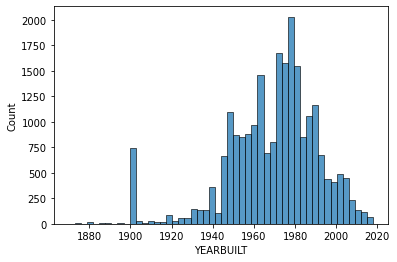

In [22]:
print(features_df.YEARBUILT.describe())
# dist plot wihout outlier
sns.histplot(data= features_df[features_df.YEARBUILT > 1600],
             x= 'YEARBUILT', 
             bins= 50
            )
plt.show()

That is interesting, there is a peak at the begining of 1900 and than the house building starts after 1945. We have a boom around 1980 and then a decrease. Despite the decrease, 25% of houses are quite new - less than 30 years old.

Let's check year built distribution over damage class.

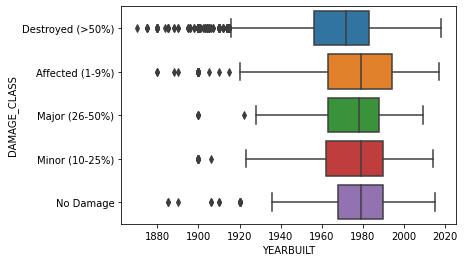

In [23]:
sns.boxplot(
    data= features_df[features_df.YEARBUILT > 1600], # slice just to plot boxplot
    x = 'YEARBUILT',
    y = 'DAMAGE_CLASS'
)
plt.show()

In [24]:
feature_dist_by_cat_df(features_df[features_df.YEARBUILT > 1600], 'YEARBUILT', 'DAMAGE_CLASS')

,Destroyed (>50%)_dist,Affected (1-9%)_dist,Major (26-50%)_dist,Minor (10-25%)_dist,No Damage_dist
count,21634.000000,961.000000,96.000000,193.000000,338.000000
mean,1968.771656,1975.708637,1973.489583,1973.046632,1976.144970
std,22.260509,26.547921,23.246503,27.250820,22.690924
min,1870.000000,1880.000000,1900.000000,1900.000000,1885.000000
25%,1956.000000,1963.000000,1963.000000,1962.000000,1968.000000
50%,1972.000000,1979.000000,1978.000000,1979.000000,1979.000000
75%,1983.000000,1994.000000,1988.000000,1990.000000,1990.000000
max,2018.000000,2017.000000,2009.000000,2014.000000,2015.000000


The distributions of the year of building differ slightly over the damage category.

#### Create a new feature - BUILDNG_AGE

In [25]:
def split_time(x, n): 
    return x.split('/')[n] if isinstance(x, str) else None

In [26]:
print('Unique:',features_df['INCIDENTST'].nunique())

# execute month; day; year
features_df['YEAR_INCIDENTST'] = features_df.INCIDENTST.apply(
    lambda x: int(x.split('/')[2]) if isinstance(x, str) else x)

Unique: 4


In [27]:
features_df['BUILDNG_AGE'] = features_df[['YEAR_INCIDENTST', 'YEARBUILT']].apply(
    lambda x: x[0] - x[1] if not any([pd.isnull(c) for c in x]) else None, axis=1)
pn = round(features_df.BUILDNG_AGE.isnull().mean() * 100,1)
print(f'Percent of None in BUILDNG_AGE: {pn}%')
# drop YEARBUILT column
features_df.drop(columns = ['YEARBUILT'], inplace= True)
del pn

Percent of None in BUILDNG_AGE: 26.7%


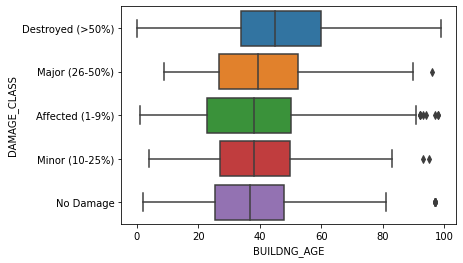

In [28]:
sns.boxplot(
    data= features_df[features_df.BUILDNG_AGE < 100],
    x = 'BUILDNG_AGE',
    y = 'DAMAGE_CLASS'
)
plt.show()

Now it is more obvious that old buildings have greater building age (median value shift to the right while the damage is increasing), so we will work with building age instead of building year. We plan to train tree-based model in the future, so we can keep the outliers without any changes.

## STREETTYPE

In [29]:
# clean STREETTYPE
prcnt1 = round((features_df.STREETTYPE == '-').mean() * 100,5)
features_df.STREETTYPE = features_df.STREETTYPE.apply(
    lambda x: None if isinstance(x,str) and x == '-' else x) 
prcnt2 = round((features_df.STREETTYPE == '-').mean() * 100,5)
print(f'Drop - value in STREETTYPE; Percent of - changed from {prcnt1}% -> to {prcnt2}%')

Drop - value in STREETTYPE; Percent of - changed from 0.02209% -> to 0.0%


Let's plot damage class distribution over street type

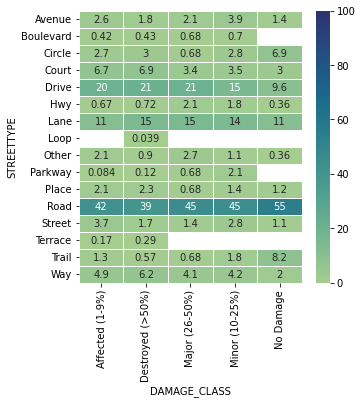

In [30]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'STREETTYPE')

Some insights from the above plot:
1. We can see that while the Road street type is the most popular one, there is the smallest percent of Road street type in Destroyed damage class - 39% and 55% of Road street type in No Damage class.  
2. In Affected class the percent of Road street type (is equal to 42%) and differ from Major and Minor (which both are equal to 45%) not so significantly. So it looks like that road can prevent buildings from fire damage (to test this hypothesis more rigorously, one must turn to a statistical test).   
3. Also, we can see that percent (9.6%) for Drive street type in No Damage class is much lower than in other groups, but in Affected damage class percent (20%) is higher than percent in Minor damage class (15%).   
4. Percent of Cicrcle (6.9%) and Trail (8.2%) street types are the highest in No Damage class.   
5. Percent of Way street type (6.2%) is the highest for Destroyed class and lowest for No Damage class.  

Looks like this feature will be important in especially to detect No Damage and Destroyed classes.

## VEGCLEARAN

In [31]:
# We need to clean this feature first
veg_di = {
    "0-30'":"0-30",
    ">100'":">100",
    "30-100'":"30-100",
    'unknown': None,
    '-':'None'
}

print(features_df.VEGCLEARAN.apply(lambda x: fix_classes_names(x, veg_di)).value_counts())
features_df.VEGCLEARAN = features_df.VEGCLEARAN.apply(lambda x: fix_classes_names(x, veg_di))

0-30      23486
30-100     2251
30-60      1279
>100        727
60-100      522
None         28
Name: VEGCLEARAN, dtype: int64


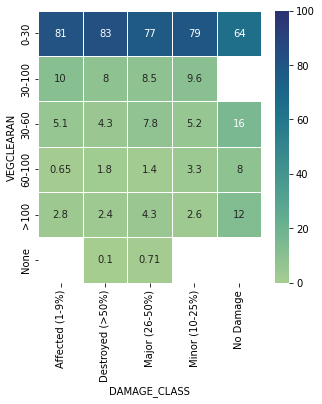

In [32]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'VEGCLEARAN')

On this plot we can see that No Damage class has the lowest percent (64%) VEGCLEARAN for 0-30 bucket and much higher values for other VEGCLEARAN buckets. According to this plot, we can make an assumption that the higher VEGCLEARAN is, the lower damage is.
 

## STRUCTURET

First, we need to clean STRUCTURET values 

In [33]:
def clean_structrt(x):
    return x.replace(' - ', ' ').replace('-', ' ') if isinstance(x,str) else x

In [34]:
n_old = features_df.STRUCTURET.nunique()
features_df.STRUCTURET = features_df.STRUCTURET.map(clean_structrt)
print(f'Nunique values before cleaning: {n_old} -> after: {features_df.STRUCTURET.nunique()}')
del n_old

Nunique values before cleaning: 31 -> after: 22


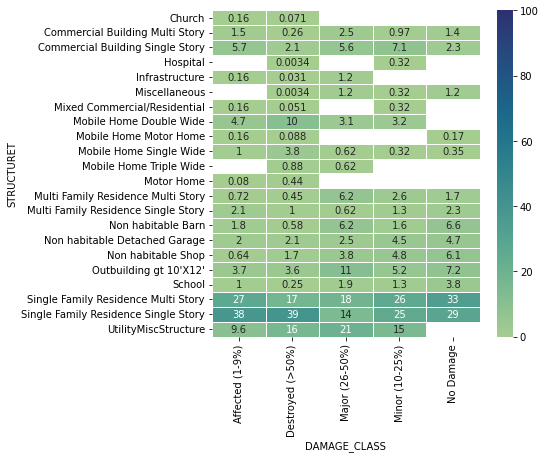

In [35]:
# Heatmap
plot_heat_map(features_df, 'DAMAGE_CLASS', 'STRUCTURET', figsize_=(6,6))

Highlights from the above plot:  
1. Mobile Home Single (3.8%) and Double Wide (10%) appear more often in Destroyed class than in other classes
2. Single Family Residence Multi Story appears more often (33%) in No Damage class rather than in Destroyed class (17%) 
3. Single Family Residence Single Story rarely appears in Major class (14%) and more often in Affected (38%) and Destroyed (39) calsses. 

## ROOFCONSTR

In [36]:
features_df.ROOFCONSTR.value_counts()

Asphalt           16511
Fire Resistant     8325
Metal              3236
Tile                773
Combustible         701
Wood                137
Other               118
Concrete            115
Name: ROOFCONSTR, dtype: int64

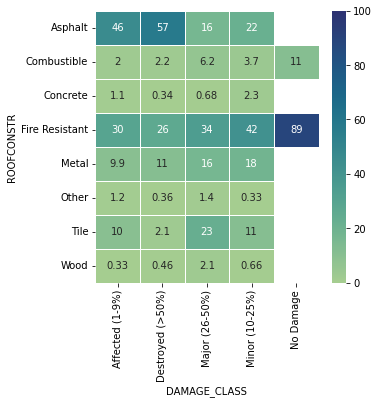

In [37]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'ROOFCONSTR')

1. In No Damage class we have only two types of roof: Fire Resistant roof (89%) and Combistible (11%)
2. Asphalt roof type is the most popular (57%) in Destroyed class
3. Fire resistant roof is the least popular (26%) roof type for Damage class

Looks like a fire resistant roof can protect buildings from damage. I expect it to be the top feature in the model.

## EAVES

In [38]:
# clean
n_old = features_df.EAVES.nunique()
features_df.EAVES = features_df.EAVES.apply(
    lambda x: 'Unenclosed' if isinstance(x,str) and x == 'Un-Enclosed' else x)
print(f'Nunique values before cleaning: {n_old} -> after: {features_df.EAVES.nunique()}')
del n_old

Nunique values before cleaning: 5 -> after: 4


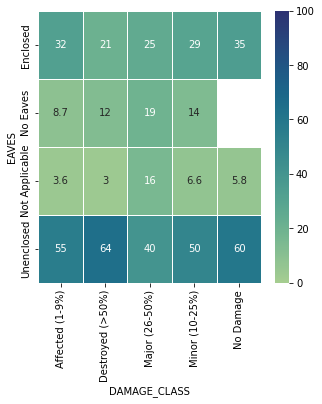

In [39]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'EAVES')
plt.show()

1. We have close percents for Unenclosed eaves for No Damage class (60%) and for Destroyed class (64).
2. If we look at Enclosed eaves,  we can see the lowest value for Destroyed class (21%) and the highest value (35%) for No Damage class. In general, higher enclosed percent corresponds to less damage.

## VENTSCREEN

The field is called Ventscreen and we have values No and Unscreened in this field. Let's combine these values.

In [40]:
df.VENTSCREEN.value_counts()

Mesh Screen > 1/8"     9086
Mesh Screen <= 1/8"    4927
Yes                    4445
No Vents               2958
Unscreened              463
No                      368
Name: VENTSCREEN, dtype: int64

In [41]:
print(features_df.VENTSCREEN.unique())

['Mesh Screen > 1/8"' 'No Vents' 'Unscreened' nan 'Mesh Screen <= 1/8"'
 'Yes' 'No']


In [42]:
n_old = features_df.VENTSCREEN.nunique()
features_df.VENTSCREEN = features_df.VENTSCREEN.apply(
    lambda x: 'No' if isinstance(x, str) and x == 'Unscreened' else x)
print(f'Nunique values before cleaning: {n_old} -> after: {features_df.VENTSCREEN.nunique()}')
del n_old

Nunique values before cleaning: 6 -> after: 5


In [43]:
features_df.VENTSCREEN.value_counts()

Mesh Screen > 1/8"     9086
Mesh Screen <= 1/8"    4927
Yes                    4445
No Vents               2958
No                      831
Name: VENTSCREEN, dtype: int64

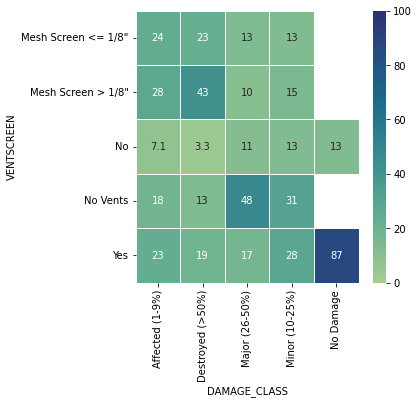

In [44]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'VENTSCREEN')
plt.show()

## EXTERIORSI

In [45]:
features_df.EXTERIORSI.value_counts()

Combustible           17283
Ignition Resistant     8290
Fire Resistant         4226
Name: EXTERIORSI, dtype: int64

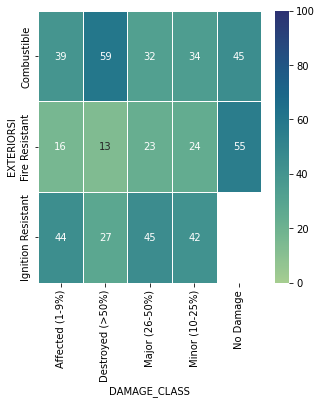

In [46]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'EXTERIORSI')
plt.show()

## WINDOWPANE

According to the internet, there are Single Pane, Double Pane and Multi Pane so let's combine Single Pane and Single in one category.

In [47]:
n_old = features_df.WINDOWPANE.nunique()
features_df.WINDOWPANE = features_df.WINDOWPANE.apply(
    lambda x: 'Single Pane' if isinstance(x, str) and x == 'Single' else x)
print(f'Nunique values before cleaning: {n_old} -> after: {features_df.WINDOWPANE.nunique()}')
del n_old

Nunique values before cleaning: 4 -> after: 3


In [48]:
# combine single and single Pane
features_df.WINDOWPANE.value_counts()

Multi Pane     13980
Single Pane     9166
No Windows      1735
Name: WINDOWPANE, dtype: int64

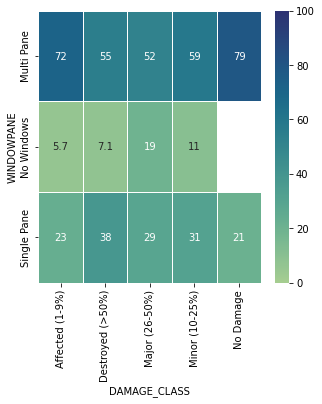

In [49]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'WINDOWPANE')
plt.show()

## TOPOGRAPHY

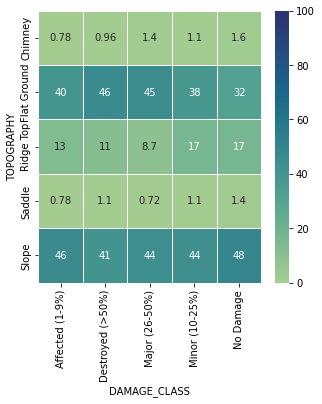

In [50]:
plot_heat_map(features_df, 'DAMAGE_CLASS', 'TOPOGRAPHY')
plt.show()

# Neighbor features

So, we can see some dependences between our features and the target. On interactive geo map we can notice that close buildings with the same structure type can have different damage. So, we have data samples where really close buildings (in terms of features) have different targets and this is the noise for our model. Let's take into account not only individual building features but also impact from neighbor buildings.

To do this, let's create neighbor features:
1. First, fix the name of incident. Thus, we will have buildings that have been in the same fire, and minimize our calculations.
2. For each building we calculate features over its neighbors (consider only the fixed incident). 
3. I choose to calculate features over 10 closest neighbors excluding zero distance. The number of neighbors can be considered as a hyperparameter and can be tuned to improve model performance. As a baseline estimation,  I took 10 neighbors because this number can give us an idea of the landscape, the different types of buildings around, including garages and non-residential buildings with a layer of neighboring buildings.
4. Calculate previosly selected 10 features over neighboring buildings for each building:   
    4.1 For each value of each categorical feature (excluding missing values) we count how many neighboring buildings have that particular value. So from each feature we get N new features, where N is the number of feature values.  
    4.2 Two statistics for BUILDNG_AGE: median and std over neighbor buildings  
5. Add some new features:  
    5.1 Statistics for distances between the building and its neighbors: min, max, median, std   
6. Iterate over incidents and repeat steps 1-4 for each incident. The resulted dataframe is saved into csv table.
7. The execution time is about 5 minutes, since it uses a numpy array and DistanceMetric from sklearn, which makes the process quite fast

## Functions

In [51]:
def calc_dist_matrix(arr):
    '''arr - 2D array; each 1D array - latitude & longitude respectively.
       Distance calculated in meters.
    '''
    dist = DistanceMetric.get_metric('haversine')
    return np.rint(dist.pairwise(arr)* 6371000).astype(int)

def closest_index(dm, top_n:int):
    '''return top_n closest index of samples without self zero distance index'''
    return np.argsort(dm, axis=1)[:,1:top_n+1] # 

def feature_val_counter(feature_vals_di, feature_name:str, input_vals:list): 
    '''Calculate occurrence for every val in input_vals list'''
    # initialize dictionary
    keys = feature_vals_di.get(feature_name)
    count_di = dict(zip(keys, np.zeros_like(keys)))
    # count feature val
    input_vals = [c for c in input_vals if not pd.isnull(c)] # drop null values from counter
    for val in input_vals:
        count_di[val]+=1
    # add prefix
    count_di = {f'nbr_{feature_name}_{key}':val for key, val in count_di.items()}
    assert len(count_di) == len(keys), 'Error in feature_val_counter, values are lost' 
    return count_di

def calculate_neighbors_features(feature_vals_df, dist_matrix, arg_closest, features_unique_vals_di:dict):
    ''''''
    res_li = []
    nrows = feature_vals_df.shape[0]
    for i in range(nrows):
        fearts_di = {}
        arg_ = arg_closest[i] # index of closest top_n neighbors 
        # distance features - distance statistics describe top_n neighbors 
        fearts_di['nbr_min_dist'] = np.min(dist_matrix[i, arg_]) 
        fearts_di['nbr_max_dist'] = np.max(dist_matrix[i, arg_])
        fearts_di['nbr_med_neigh_dist'] = np.median(dist_matrix[i, arg_])
        fearts_di['nbr_std_dist'] = np.std(dist_matrix[i, arg_])
        
        # counter features based on categorical values
        for feature_n, feature_name in enumerate(features_unique_vals_di.keys()):
            tvals = feature_vals_df[arg_, feature_n]
            
            # year build feature
            if feature_name == 'BUILDNG_AGE':
                #fearts_di['Min_YEARBUILT'] = np.min(tvals)
                fearts_di['nbr_medn_BUILDNG_AGE'] = np.median(tvals)
                fearts_di['nbr_std_BUILDNG_AGE'] = np.std(tvals)
            else:
                fearts_di.update(
                    feature_val_counter(features_unique_vals_di, feature_name, tvals))

        res_li.append(fearts_di)
    return pd.DataFrame(res_li)

In [52]:
def calculate_features_over_n_closest_neibours(
    df, features_unique_vals_di_:dict, dist_folder_path_:str, neigh_features_path_:str, fnl_df_path_:str):
    ''''''
    
    dfs_li = []
    incnu_li = df.INCIDENTNU.unique()
    # loop over fire number
    for inc_nu in tqdm(incnu_li):
        print(f'Incident number: {inc_nu} in process..')
        slice_df = df[df.INCIDENTNU == inc_nu].copy()
        slice_df.reset_index(drop= True, inplace= True)
        
        # Can not calculate distance for one point
        if slice_df.shape[0] <= 1:
            continue

        # calc distances:
        dist_arr = calc_dist_matrix(
            slice_df[['LATITUDE', 'LONGITUDE']].values)

        # save df with distances: 
        dist_df = pd.DataFrame(dist_arr)
        dist_df = pd.concat([slice_df[['GLOBALID']], dist_df], axis=1)
        dist_df.to_csv(f'{dist_folder_path_}/dist_top_{top_n}_{inc_nu}.csv', index= False)

        # top_n closest neighbors:
        arg_closest = closest_index(dist_arr, top_n)

        # calc ceatures over neighbors:
        res_df = calculate_neighbors_features(
            slice_df[feature_clmns].values, dist_arr, arg_closest, features_unique_vals_di_)
        # add id:
        res_df = pd.concat([slice_df[['GLOBALID']],res_df], axis=1)

        # add df to list:
        dfs_li.append(res_df)

        # save feature df: 
        res_df.to_csv(f'{neigh_features_path_}/features_{inc_nu}.csv', index= False)
    
    # concat and save final df:
    fnl_df = pd.concat(dfs_li, ignore_index= True)
    fnl_df.to_csv(fnl_df_path_, index= False)
    return fnl_df

## Generate Neighbors features

In [53]:
!rm -rf calculated_distances 

In [54]:
!rm -rf neighbors_features

In [55]:
!rm top_10_neighbors_featrs_df.csv

rm: top_10_neighbors_featrs_df.csv: No such file or directory


In [56]:
feature_clmns = [
    'BUILDNG_AGE',
    'STREETTYPE',
    'VEGCLEARAN',
    'STRUCTURET',
    'ROOFCONSTR',
    'EAVES',
    'VENTSCREEN',
    'EXTERIORSI',
    'WINDOWPANE',
    'TOPOGRAPHY',
]

top_n = 10

features_unique_vals_di = {
    clmn_name:features_df[clmn_name].dropna().unique() for clmn_name in feature_clmns}
#print(features_unique_vals_di)
print(len(features_unique_vals_di))

10


In [57]:
dist_folder_path = 'calculated_distances'
assert not os.path.exists(dist_folder_path), 'Error, folder with distances exists..'
os.makedirs('calculated_distances')

neigh_features_path = 'neighbors_features'
assert not os.path.exists(neigh_features_path), 'Error, folder with neib features exists..'
os.makedirs('neighbors_features')

fnl_df_path = f'top_{top_n}_neighbors_featrs_df.csv'
assert not os.path.exists(fnl_df_path), 'Error, final df path exists..'

In [58]:
%%time
nbr_df = calculate_features_over_n_closest_neibours(
    df = features_df,
    features_unique_vals_di_ = features_unique_vals_di, 
    dist_folder_path_ = dist_folder_path, 
    neigh_features_path_ = neigh_features_path, 
    fnl_df_path_ = fnl_df_path
)
print(nbr_df.shape)

  0%|          | 0/12 [00:00<?, ?it/s]

Incident number: CA-BTU-016737 in process..
Incident number: CAVNC-091023 in process..
Incident number: CAVNC-090993 in process..
Incident number: CALNU010046 in process..
Incident number: CALNU010049 in process..
Incident number: CA-LNU-010105 in process..
Incident number: CA-BTU-015933 in process..
Incident number: CA-NEU-026295 in process..
Incident number: CALNU10055 in process..
Incident number: CAMEU 012169 in process..
Incident number: CALNU 010104 in process..
Incident number: CANEU026269 in process..
(31684, 79)
CPU times: user 4min 30s, sys: 33.3 s, total: 5min 3s
Wall time: 5min 8s


In [59]:
print(nbr_df.shape)
nbr_df.head(3)

(31684, 79)


,GLOBALID,nbr_min_dist,nbr_max_dist,nbr_med_neigh_dist,nbr_std_dist,nbr_medn_BUILDNG_AGE,nbr_std_BUILDNG_AGE,nbr_STREETTYPE_Drive,nbr_STREETTYPE_Road,nbr_STREETTYPE_Lane,nbr_STREETTYPE_Way,nbr_STREETTYPE_Court,nbr_STREETTYPE_Avenue,nbr_STREETTYPE_Trail,nbr_STREETTYPE_Street,nbr_STREETTYPE_Boulevard,nbr_STREETTYPE_Place,nbr_STREETTYPE_Circle,nbr_STREETTYPE_Other,nbr_STREETTYPE_Terrace,nbr_STREETTYPE_Parkway,nbr_STREETTYPE_Loop,nbr_STREETTYPE_Hwy,nbr_VEGCLEARAN_0-30,nbr_VEGCLEARAN_30-100,nbr_VEGCLEARAN_>100,nbr_VEGCLEARAN_30-60,nbr_VEGCLEARAN_60-100,nbr_VEGCLEARAN_None,nbr_STRUCTURET_Mobile Home Double Wide,nbr_STRUCTURET_Single Family Residence Single Story,nbr_STRUCTURET_UtilityMiscStructure,nbr_STRUCTURET_Mobile Home Single Wide,nbr_STRUCTURET_Commercial Building Single Story,nbr_STRUCTURET_Multi Family Residence Single Story,nbr_STRUCTURET_Mobile Home Triple Wide,nbr_STRUCTURET_School,nbr_STRUCTURET_Single Family Residence Multi Story,nbr_STRUCTURET_Motor Home,nbr_STRUCTURET_Mixed Commercial/Residential,nbr_STRUCTURET_Commercial Building Multi Story,nbr_STRUCTURET_Church,nbr_STRUCTURET_Multi Family Residence Multi Story,nbr_STRUCTURET_Infrastructure,nbr_STRUCTURET_Outbuilding gt 10'X12',nbr_STRUCTURET_Non habitable Detached Garage,nbr_STRUCTURET_Non habitable Shop,nbr_STRUCTURET_Non habitable Barn,nbr_STRUCTURET_Miscellaneous,nbr_STRUCTURET_Mobile Home Motor Home,nbr_STRUCTURET_Hospital,nbr_ROOFCONSTR_Asphalt,nbr_ROOFCONSTR_Metal,nbr_ROOFCONSTR_Concrete,nbr_ROOFCONSTR_Other,nbr_ROOFCONSTR_Tile,nbr_ROOFCONSTR_Wood,nbr_ROOFCONSTR_Fire Resistant,nbr_ROOFCONSTR_Combustible,nbr_EAVES_Enclosed,nbr_EAVES_Unenclosed,nbr_EAVES_No Eaves,nbr_EAVES_Not Applicable,"nbr_VENTSCREEN_Mesh Screen > 1/8""",nbr_VENTSCREEN_No Vents,nbr_VENTSCREEN_No,"nbr_VENTSCREEN_Mesh Screen <= 1/8""",nbr_VENTSCREEN_Yes,nbr_EXTERIORSI_Ignition Resistant,nbr_EXTERIORSI_Combustible,nbr_EXTERIORSI_Fire Resistant,nbr_WINDOWPANE_Single Pane,nbr_WINDOWPANE_Multi Pane,nbr_WINDOWPANE_No Windows,nbr_TOPOGRAPHY_Flat Ground,nbr_TOPOGRAPHY_Slope,nbr_TOPOGRAPHY_Ridge Top,nbr_TOPOGRAPHY_Chimney,nbr_TOPOGRAPHY_Saddle
0,{44673E14-1CA5-4AE5-BAD2-FBB23CEE6E17},688,1868,1328.0,382.869808,118.0,0.0,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,9,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,0,0,0,0,0,0,6,0,0,0,6,4,0,0,0,8,2,0,3,7,0,10,0,0,0,0
1,{0D5163EE-231B-43C6-8B61-FF7301765CAE},604,1952,1479.0,451.825586,118.0,0.0,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,9,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,0,0,0,0,0,0,6,0,0,0,7,3,0,0,0,7,3,0,4,6,0,10,0,0,0,0
2,{316A2D22-D5CE-4FFD-BE9A-A39485DD7FC3},604,1916,1652.5,446.607535,118.0,0.0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,4,0,0,0,0,0,0,7,0,0,0,8,2,0,0,0,6,4,0,6,4,0,10,0,0,0,0


In [60]:
# Needs to drop/check columns

## Combine all columns

Now let's combine all our data together and save it.

In [61]:
all_features_df = features_df.merge(nbr_df, on = 'GLOBALID')
print(all_features_df.shape)
assert all_features_df.shape[0] == features_df.shape[0], 'Error while merge features'
all_features_df.to_csv('temp_all_features_df.csv', index= False)
all_features_df.head(2)

(31684, 112)


,DAMAGE,STREETNUMB,STREETNAME,STREETTYPE,STREETSUFF,CITY,STATE,CALFIREUNI,COUNTY,COMMUNITY,INCIDENTNA,INCIDENTNU,INCIDENTST,HAZARDTYPE,VEGCLEARAN,STRUCTURET,ROOFCONSTR,EAVES,VENTSCREEN,EXTERIORSI,WINDOWPANE,TOPOGRAPHY,APN,ASSESSEDIM,SITEADDRES,GLOBALID,GEOMETRY,LONGITUDE,LATITUDE,CLAIM,DAMAGE_CLASS,DAMAGE_COLOR,YEAR_INCIDENTST,BUILDNG_AGE,nbr_min_dist,nbr_max_dist,nbr_med_neigh_dist,nbr_std_dist,nbr_medn_BUILDNG_AGE,nbr_std_BUILDNG_AGE,nbr_STREETTYPE_Drive,nbr_STREETTYPE_Road,nbr_STREETTYPE_Lane,nbr_STREETTYPE_Way,nbr_STREETTYPE_Court,nbr_STREETTYPE_Avenue,nbr_STREETTYPE_Trail,nbr_STREETTYPE_Street,nbr_STREETTYPE_Boulevard,nbr_STREETTYPE_Place,nbr_STREETTYPE_Circle,nbr_STREETTYPE_Other,nbr_STREETTYPE_Terrace,nbr_STREETTYPE_Parkway,nbr_STREETTYPE_Loop,nbr_STREETTYPE_Hwy,nbr_VEGCLEARAN_0-30,nbr_VEGCLEARAN_30-100,nbr_VEGCLEARAN_>100,nbr_VEGCLEARAN_30-60,nbr_VEGCLEARAN_60-100,nbr_VEGCLEARAN_None,nbr_STRUCTURET_Mobile Home Double Wide,nbr_STRUCTURET_Single Family Residence Single Story,nbr_STRUCTURET_UtilityMiscStructure,nbr_STRUCTURET_Mobile Home Single Wide,nbr_STRUCTURET_Commercial Building Single Story,nbr_STRUCTURET_Multi Family Residence Single Story,nbr_STRUCTURET_Mobile Home Triple Wide,nbr_STRUCTURET_School,nbr_STRUCTURET_Single Family Residence Multi Story,nbr_STRUCTURET_Motor Home,nbr_STRUCTURET_Mixed Commercial/Residential,nbr_STRUCTURET_Commercial Building Multi Story,nbr_STRUCTURET_Church,nbr_STRUCTURET_Multi Family Residence Multi Story,nbr_STRUCTURET_Infrastructure,nbr_STRUCTURET_Outbuilding gt 10'X12',nbr_STRUCTURET_Non habitable Detached Garage,nbr_STRUCTURET_Non habitable Shop,nbr_STRUCTURET_Non habitable Barn,nbr_STRUCTURET_Miscellaneous,nbr_STRUCTURET_Mobile Home Motor Home,nbr_STRUCTURET_Hospital,nbr_ROOFCONSTR_Asphalt,nbr_ROOFCONSTR_Metal,nbr_ROOFCONSTR_Concrete,nbr_ROOFCONSTR_Other,nbr_ROOFCONSTR_Tile,nbr_ROOFCONSTR_Wood,nbr_ROOFCONSTR_Fire Resistant,nbr_ROOFCONSTR_Combustible,nbr_EAVES_Enclosed,nbr_EAVES_Unenclosed,nbr_EAVES_No Eaves,nbr_EAVES_Not Applicable,"nbr_VENTSCREEN_Mesh Screen > 1/8""",nbr_VENTSCREEN_No Vents,nbr_VENTSCREEN_No,"nbr_VENTSCREEN_Mesh Screen <= 1/8""",nbr_VENTSCREEN_Yes,nbr_EXTERIORSI_Ignition Resistant,nbr_EXTERIORSI_Combustible,nbr_EXTERIORSI_Fire Resistant,nbr_WINDOWPANE_Single Pane,nbr_WINDOWPANE_Multi Pane,nbr_WINDOWPANE_No Windows,nbr_TOPOGRAPHY_Flat Ground,nbr_TOPOGRAPHY_Slope,nbr_TOPOGRAPHY_Ridge Top,nbr_TOPOGRAPHY_Chimney,nbr_TOPOGRAPHY_Saddle
0,Destroyed (>50%),1480,Patrick,Drive,154,Paradise Northwest A,CA,BTU,Butte,Paradise,Camp,CA-BTU-016737,11/8/2018,Fire,0-30,Mobile Home Double Wide,Asphalt,NaN,"Mesh Screen > 1/8""",Ignition Resistant,Single Pane,Flat Ground,050-150-111-000,2756731,1400 KILCREASE CIR PARADISE CA 95969,{44673E14-1CA5-4AE5-BAD2-FBB23CEE6E17},POINT (-121.5905677572311 39.7826496849055),-121.590568,39.78265,629141.49,Destroyed (>50%),purple,2018.0,118.0,688,1868,1328.0,382.869808,118.0,0.0,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,9,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,0,0,0,0,0,0,6,0,0,0,6,4,0,0,0,8,2,0,3,7,0,10,0,0,0,0
1,Destroyed (>50%),1480,Patrick,Drive,156,Paradise Northwest A,CA,BTU,Butte,Paradise,Camp,CA-BTU-016737,11/8/2018,Fire,0-30,Mobile Home Double Wide,Asphalt,NaN,"Mesh Screen > 1/8""",Ignition Resistant,Multi Pane,Flat Ground,050-150-111-000,2756731,1400 KILCREASE CIR PARADISE CA 95969,{0D5163EE-231B-43C6-8B61-FF7301765CAE},POINT (-121.5903517061171 39.78267012986168),-121.590352,39.78267,812980.07,Destroyed (>50%),purple,2018.0,118.0,604,1952,1479.0,451.825586,118.0,0.0,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,9,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,0,0,0,0,0,0,6,0,0,0,7,3,0,0,0,7,3,0,4,6,0,10,0,0,0,0


We have the prepared dataframe, so we can train the model now, but first give me a chance to make some comments...

1. I choose XGBoost to solve this problem because it can deal with None values and it is one of the best tools when we are ?spealing about table data. Applying XGBoost model, we minimize our bias of error because of bagging technique and minimize variance of error as well because we use complex base algorithms such as trees. Each time the next tree is trained, the algorithm tries to minimize the current error.
2. I will use two possible approaches for a multiclass classification task. The first one is multiclass classification and the second one is the one-VS-rest (oVSr) strategy when we train many models to predict one class vs other classes. The latter approach converts the multi-class classification problem to binary classification, and the number of models is equal to the number of classes.
3. Because we work with unbalanced data I will train and compare two multiclass classification models with sample weights and without them and compare the results using confusion matrix.
4. According to the task, we  do not need to optimize any specific metrics. So I will consider and analyze a confusion matrix more than other possible metrics.
5. When I split data into train and test, I will use stratification over Damage class because we do not have enough data to add more stratification columns (for example, building structure) 
6. I will use only 100 trees because after 100-120 trees the error on the training data set differs enough from the error on the test set =>  the model begins to overfit.
7. I will skip such model development steps as cross validation, feature selection, excluding not informative feature, reducing dim of features with PCA, etc. because, as it was mentioned in the task, I do need to focus on model performance, so instead I focused on the approach.
8. I will use pd.get_dummies to generate dummies variables. However, in my opinion in production (real life) it is better to train transformer from sklearn on training data set and apply it to test  (or inference) data set.
9. We also have many categorical features in our data. Perhaps, an average target encoding could improve the results. But since our data has a timestamp, we need to take it into account to avoid leaks. Since we're ignoring the timestamp shuffling the data, we won't apply the average target encoding to get more honest results.
10. I also tried CATBoost instead of XGBoost because it works well with categorical features. The results were really close to Xgboost so I did not include this part in this notebook.

#  Train Multiclass classification model

## Helper functions

In [62]:
def clean_feature_names(df):
    '''Clean feature names to apply pd dummies'''
    clmn_names = list(df.columns)
    for i, c in enumerate(df.columns):
        if re.findall('<', c):
            clmn_names[i] = clmn_names[i].replace('<','_less_')
        elif re.findall('>', c):
            clmn_names[i] = clmn_names[i].replace('>','_grt_')
        elif re.findall('=', c):
            clmn_names[i] = clmn_names[i].replace('=','_eql_')
        else:
            continue
    df.columns = clmn_names     
    return df

def train_xgb_classfr(X_train, y_train, X_test, y_test, smpl_w= False):
    '''Return trained model'''
    
    # initialize model
    xgb_clf = xgb.XGBClassifier(objective='multi:softmax', 
                                num_class=5, 
                                learning_rate=0.01,
                                n_estimators = 100,
                                max_depth = 10,
                                early_stopping_rounds=20,
                                seed=42)
    # check smpl_w falg and weigh samples if required 
    if smpl_w:
        # calculate sample weights
        sample_weights = compute_sample_weight(
            class_weight='balanced',
            y=y_train)
        # train model
        xgb_clf.fit(X_train, 
                    y_train,
                    verbose=1, 
                    sample_weight=sample_weights,
                    eval_set=[(X_train, y_train), (X_test, y_test)])
    else: 
        # train model
        xgb_clf.fit(X_train, 
                    y_train,
                    verbose=1, 
                    eval_set=[(X_train, y_train), (X_test, y_test)])
    
    return xgb_clf

def plot_conf_matrix(y_test, y_pred, class_di):
    '''Plot confusion matrix'''
    labels_li = list(class_di.keys())[::-1]
    conf_m = confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots(figsize = (6,5))
    sns.heatmap(conf_m, xticklabels=labels_li, yticklabels=labels_li, linewidth=.8, 
                annot= True, fmt='g', cmap= 'Blues')
    plt.show()

def print_key_metrics(y_test, y_pred):
    '''Print key metrics'''
    print('\n-------------------- Key Metrics --------------------')
    print('\nAccuracy: {:.2f}'.format(accuracy_score(y_test, y_pred)))
    print('Balanced Accuracy: {:.2f}\n'.format(balanced_accuracy_score(y_test, y_pred)))

    print('Micro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='micro')))
    print('Micro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='micro')))
    print('Micro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='micro')))

    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))

    print('Weighted Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='weighted')))
    print('Weighted Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='weighted')))
    print('Weighted F1-score: {:.2f}'.format(f1_score(y_test, y_pred, average='weighted')))

## Combine features

In [63]:
initial_features = [
    'DAMAGE_CLASS',
    'BUILDNG_AGE',
    'STREETTYPE',
    'VEGCLEARAN',
    'STRUCTURET',
    'ROOFCONSTR',
    'EAVES',
    'VENTSCREEN',
    'EXTERIORSI',
    'WINDOWPANE',
    'TOPOGRAPHY',
]

generated_clmns =list(nbr_df.columns)[1:]
print(len(initial_features), len(generated_clmns))

all_feature_clmns = initial_features + generated_clmns
print(len(all_feature_clmns))

tomodel_df = all_features_df[all_feature_clmns].copy()
print(tomodel_df.shape)
tomodel_df.head(3)

11 78
89
(31684, 89)


,DAMAGE_CLASS,BUILDNG_AGE,STREETTYPE,VEGCLEARAN,STRUCTURET,ROOFCONSTR,EAVES,VENTSCREEN,EXTERIORSI,WINDOWPANE,TOPOGRAPHY,nbr_min_dist,nbr_max_dist,nbr_med_neigh_dist,nbr_std_dist,nbr_medn_BUILDNG_AGE,nbr_std_BUILDNG_AGE,nbr_STREETTYPE_Drive,nbr_STREETTYPE_Road,nbr_STREETTYPE_Lane,nbr_STREETTYPE_Way,nbr_STREETTYPE_Court,nbr_STREETTYPE_Avenue,nbr_STREETTYPE_Trail,nbr_STREETTYPE_Street,nbr_STREETTYPE_Boulevard,nbr_STREETTYPE_Place,nbr_STREETTYPE_Circle,nbr_STREETTYPE_Other,nbr_STREETTYPE_Terrace,nbr_STREETTYPE_Parkway,nbr_STREETTYPE_Loop,nbr_STREETTYPE_Hwy,nbr_VEGCLEARAN_0-30,nbr_VEGCLEARAN_30-100,nbr_VEGCLEARAN_>100,nbr_VEGCLEARAN_30-60,nbr_VEGCLEARAN_60-100,nbr_VEGCLEARAN_None,nbr_STRUCTURET_Mobile Home Double Wide,nbr_STRUCTURET_Single Family Residence Single Story,nbr_STRUCTURET_UtilityMiscStructure,nbr_STRUCTURET_Mobile Home Single Wide,nbr_STRUCTURET_Commercial Building Single Story,nbr_STRUCTURET_Multi Family Residence Single Story,nbr_STRUCTURET_Mobile Home Triple Wide,nbr_STRUCTURET_School,nbr_STRUCTURET_Single Family Residence Multi Story,nbr_STRUCTURET_Motor Home,nbr_STRUCTURET_Mixed Commercial/Residential,nbr_STRUCTURET_Commercial Building Multi Story,nbr_STRUCTURET_Church,nbr_STRUCTURET_Multi Family Residence Multi Story,nbr_STRUCTURET_Infrastructure,nbr_STRUCTURET_Outbuilding gt 10'X12',nbr_STRUCTURET_Non habitable Detached Garage,nbr_STRUCTURET_Non habitable Shop,nbr_STRUCTURET_Non habitable Barn,nbr_STRUCTURET_Miscellaneous,nbr_STRUCTURET_Mobile Home Motor Home,nbr_STRUCTURET_Hospital,nbr_ROOFCONSTR_Asphalt,nbr_ROOFCONSTR_Metal,nbr_ROOFCONSTR_Concrete,nbr_ROOFCONSTR_Other,nbr_ROOFCONSTR_Tile,nbr_ROOFCONSTR_Wood,nbr_ROOFCONSTR_Fire Resistant,nbr_ROOFCONSTR_Combustible,nbr_EAVES_Enclosed,nbr_EAVES_Unenclosed,nbr_EAVES_No Eaves,nbr_EAVES_Not Applicable,"nbr_VENTSCREEN_Mesh Screen > 1/8""",nbr_VENTSCREEN_No Vents,nbr_VENTSCREEN_No,"nbr_VENTSCREEN_Mesh Screen <= 1/8""",nbr_VENTSCREEN_Yes,nbr_EXTERIORSI_Ignition Resistant,nbr_EXTERIORSI_Combustible,nbr_EXTERIORSI_Fire Resistant,nbr_WINDOWPANE_Single Pane,nbr_WINDOWPANE_Multi Pane,nbr_WINDOWPANE_No Windows,nbr_TOPOGRAPHY_Flat Ground,nbr_TOPOGRAPHY_Slope,nbr_TOPOGRAPHY_Ridge Top,nbr_TOPOGRAPHY_Chimney,nbr_TOPOGRAPHY_Saddle
0,Destroyed (>50%),118.0,Drive,0-30,Mobile Home Double Wide,Asphalt,NaN,"Mesh Screen > 1/8""",Ignition Resistant,Single Pane,Flat Ground,688,1868,1328.0,382.869808,118.0,0.0,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,9,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,0,0,0,0,0,0,6,0,0,0,6,4,0,0,0,8,2,0,3,7,0,10,0,0,0,0
1,Destroyed (>50%),118.0,Drive,0-30,Mobile Home Double Wide,Asphalt,NaN,"Mesh Screen > 1/8""",Ignition Resistant,Multi Pane,Flat Ground,604,1952,1479.0,451.825586,118.0,0.0,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,9,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,0,0,0,0,0,0,6,0,0,0,7,3,0,0,0,7,3,0,4,6,0,10,0,0,0,0
2,Destroyed (>50%),118.0,Drive,0-30,Mobile Home Double Wide,Asphalt,NaN,"Mesh Screen > 1/8""",Ignition Resistant,Multi Pane,Flat Ground,604,1916,1652.5,446.607535,118.0,0.0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,4,0,0,0,0,0,0,7,0,0,0,8,2,0,0,0,6,4,0,6,4,0,10,0,0,0,0


## Get dummies for categorical features

In [64]:
# get dummies:
tomodel_df = pd.get_dummies(
    tomodel_df,
    columns = feature_clmns[1:]).copy()
# clean feature names:
tomodel_df = clean_feature_names(tomodel_df)

# map DAMAGE CLASS to numbers:

damage_val_di = {
    'Destroyed (>50%)':4,
    'Major (26-50%)'  :3,
    'Minor (10-25%)'  :2,
    'Affected (1-9%)' :1,
    'No Damage'       :0
}

tomodel_df.DAMAGE_CLASS = tomodel_df.DAMAGE_CLASS.apply(
    lambda x: fix_classes_names(x,damage_val_di))

print(tomodel_df.DAMAGE_CLASS.value_counts())
print(tomodel_df.shape)
tomodel_df.head(3)

4    29383
1     1256
0      575
2      310
3      160
Name: DAMAGE_CLASS, dtype: int64
(31684, 152)


,DAMAGE_CLASS,BUILDNG_AGE,nbr_min_dist,nbr_max_dist,nbr_med_neigh_dist,nbr_std_dist,nbr_medn_BUILDNG_AGE,nbr_std_BUILDNG_AGE,nbr_STREETTYPE_Drive,nbr_STREETTYPE_Road,nbr_STREETTYPE_Lane,nbr_STREETTYPE_Way,nbr_STREETTYPE_Court,nbr_STREETTYPE_Avenue,nbr_STREETTYPE_Trail,nbr_STREETTYPE_Street,nbr_STREETTYPE_Boulevard,nbr_STREETTYPE_Place,nbr_STREETTYPE_Circle,nbr_STREETTYPE_Other,nbr_STREETTYPE_Terrace,nbr_STREETTYPE_Parkway,nbr_STREETTYPE_Loop,nbr_STREETTYPE_Hwy,nbr_VEGCLEARAN_0-30,nbr_VEGCLEARAN_30-100,nbr_VEGCLEARAN__grt_100,nbr_VEGCLEARAN_30-60,nbr_VEGCLEARAN_60-100,nbr_VEGCLEARAN_None,nbr_STRUCTURET_Mobile Home Double Wide,nbr_STRUCTURET_Single Family Residence Single Story,nbr_STRUCTURET_UtilityMiscStructure,nbr_STRUCTURET_Mobile Home Single Wide,nbr_STRUCTURET_Commercial Building Single Story,nbr_STRUCTURET_Multi Family Residence Single Story,nbr_STRUCTURET_Mobile Home Triple Wide,nbr_STRUCTURET_School,nbr_STRUCTURET_Single Family Residence Multi Story,nbr_STRUCTURET_Motor Home,nbr_STRUCTURET_Mixed Commercial/Residential,nbr_STRUCTURET_Commercial Building Multi Story,nbr_STRUCTURET_Church,nbr_STRUCTURET_Multi Family Residence Multi Story,nbr_STRUCTURET_Infrastructure,nbr_STRUCTURET_Outbuilding gt 10'X12',nbr_STRUCTURET_Non habitable Detached Garage,nbr_STRUCTURET_Non habitable Shop,nbr_STRUCTURET_Non habitable Barn,nbr_STRUCTURET_Miscellaneous,nbr_STRUCTURET_Mobile Home Motor Home,nbr_STRUCTURET_Hospital,nbr_ROOFCONSTR_Asphalt,nbr_ROOFCONSTR_Metal,nbr_ROOFCONSTR_Concrete,nbr_ROOFCONSTR_Other,nbr_ROOFCONSTR_Tile,nbr_ROOFCONSTR_Wood,nbr_ROOFCONSTR_Fire Resistant,nbr_ROOFCONSTR_Combustible,nbr_EAVES_Enclosed,nbr_EAVES_Unenclosed,nbr_EAVES_No Eaves,nbr_EAVES_Not Applicable,"nbr_VENTSCREEN_Mesh Screen _grt_ 1/8""",nbr_VENTSCREEN_No Vents,nbr_VENTSCREEN_No,"nbr_VENTSCREEN_Mesh Screen _less_= 1/8""",nbr_VENTSCREEN_Yes,nbr_EXTERIORSI_Ignition Resistant,nbr_EXTERIORSI_Combustible,nbr_EXTERIORSI_Fire Resistant,nbr_WINDOWPANE_Single Pane,nbr_WINDOWPANE_Multi Pane,nbr_WINDOWPANE_No Windows,nbr_TOPOGRAPHY_Flat Ground,nbr_TOPOGRAPHY_Slope,nbr_TOPOGRAPHY_Ridge Top,nbr_TOPOGRAPHY_Chimney,nbr_TOPOGRAPHY_Saddle,STREETTYPE_Avenue,STREETTYPE_Boulevard,STREETTYPE_Circle,STREETTYPE_Court,STREETTYPE_Drive,STREETTYPE_Hwy,STREETTYPE_Lane,STREETTYPE_Loop,STREETTYPE_Other,STREETTYPE_Parkway,STREETTYPE_Place,STREETTYPE_Road,STREETTYPE_Street,STREETTYPE_Terrace,STREETTYPE_Trail,STREETTYPE_Way,VEGCLEARAN_0-30,VEGCLEARAN_30-100,VEGCLEARAN_30-60,VEGCLEARAN_60-100,VEGCLEARAN__grt_100,VEGCLEARAN_None,STRUCTURET_Church,STRUCTURET_Commercial Building Multi Story,STRUCTURET_Commercial Building Single Story,STRUCTURET_Hospital,STRUCTURET_Infrastructure,STRUCTURET_Miscellaneous,STRUCTURET_Mixed Commercial/Residential,STRUCTURET_Mobile Home Double Wide,STRUCTURET_Mobile Home Motor Home,STRUCTURET_Mobile Home Single Wide,STRUCTURET_Mobile Home Triple Wide,STRUCTURET_Motor Home,STRUCTURET_Multi Family Residence Multi Story,STRUCTURET_Multi Family Residence Single Story,STRUCTURET_Non habitable Barn,STRUCTURET_Non habitable Detached Garage,STRUCTURET_Non habitable Shop,STRUCTURET_Outbuilding gt 10'X12',STRUCTURET_School,STRUCTURET_Single Family Residence Multi Story,STRUCTURET_Single Family Residence Single Story,STRUCTURET_UtilityMiscStructure,ROOFCONSTR_Asphalt,ROOFCONSTR_Combustible,ROOFCONSTR_Concrete,ROOFCONSTR_Fire Resistant,ROOFCONSTR_Metal,ROOFCONSTR_Other,ROOFCONSTR_Tile,ROOFCONSTR_Wood,EAVES_Enclosed,EAVES_No Eaves,EAVES_Not Applicable,EAVES_Unenclosed,"VENTSCREEN_Mesh Screen _less_= 1/8""","VENTSCREEN_Mesh Screen _grt_ 1/8""",VENTSCREEN_No,VENTSCREEN_No Vents,VENTSCREEN_Yes,EXTERIORSI_Combustible,EXTERIORSI_Fire Resistant,EXTERIORSI_Ignition Resistant,WINDOWPANE_Multi Pane,WINDOWPANE_No Windows,WINDOWPANE_Single Pane,TOPOGRAPHY_Chimney,TOPOGRAPHY_Flat Ground,TOPOGRAPHY_Ridge Top,TOPOGRAPHY_Saddle,TOPOGRAPHY_Slope
0,4,118.0,688,1868,1328.0,382.869808,118.0,0.0,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,9,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,0,0

## Split the data

In [65]:
X_train, X_test, y_train, y_test = train_test_split(
    tomodel_df[tomodel_df.columns[1:]], tomodel_df.DAMAGE_CLASS,
    stratify=tomodel_df.DAMAGE_CLASS, 
    test_size=0.2, 
    random_state= 1)

## Train model

Let's train two models without sample weights and with sample weights. 

## Model without sample weights

In [66]:
xgb_clf = train_xgb_classfr(X_train, y_train, X_test, y_test, smpl_w= False)

[0]	validation_0-mlogloss:1.58710	validation_1-mlogloss:1.58759
[1]	validation_0-mlogloss:1.56533	validation_1-mlogloss:1.56628
[2]	validation_0-mlogloss:1.54408	validation_1-mlogloss:1.54552
[3]	validation_0-mlogloss:1.52338	validation_1-mlogloss:1.52531
[4]	validation_0-mlogloss:1.50315	validation_1-mlogloss:1.50559
[5]	validation_0-mlogloss:1.48336	validation_1-mlogloss:1.48629
[6]	validation_0-mlogloss:1.46402	validation_1-mlogloss:1.46744
[7]	validation_0-mlogloss:1.44510	validation_1-mlogloss:1.44900
[8]	validation_0-mlogloss:1.42659	validation_1-mlogloss:1.43097
[9]	validation_0-mlogloss:1.40850	validation_1-mlogloss:1.41336
[10]	validation_0-mlogloss:1.39081	validation_1-mlogloss:1.39615
[11]	validation_0-mlogloss:1.37348	validation_1-mlogloss:1.37928
[12]	validation_0-mlogloss:1.35649	validation_1-mlogloss:1.36276
[13]	validation_0-mlogloss:1.33985	validation_1-mlogloss:1.34661
[14]	validation_0-mlogloss:1.32354	validation_1-mlogloss:1.33076
[15]	validation_0-mlogloss:1.30751	

Model without sample weights train


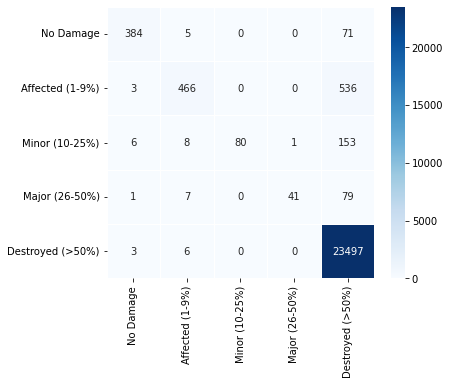

Confusion matrix № 1.1


In [67]:
print('Model without sample weights train')
y_train_preds = xgb_clf.predict(X_train)
plot_conf_matrix(y_train, y_train_preds, damage_val_di)
print('Confusion matrix № 1.1')

Model without sample weights test


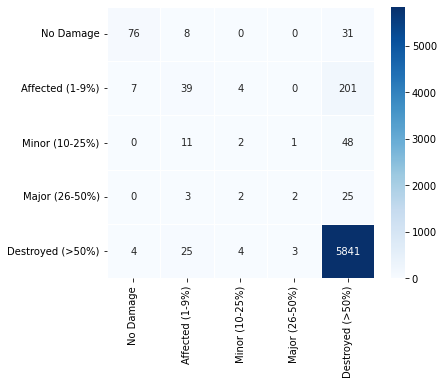

Confusion matrix № 1.2


In [68]:
print('Model without sample weights test')
y_pred = xgb_clf.predict(X_test)
plot_conf_matrix(y_test, y_pred, damage_val_di)
print('Confusion matrix № 1.2')

In [69]:
print_key_metrics(y_test, y_pred)
del y_train_preds, y_pred


-------------------- Key Metrics --------------------

Accuracy: 0.94
Balanced Accuracy: 0.38

Micro Precision: 0.94
Micro Recall: 0.94
Micro F1-score: 0.94

Macro Precision: 0.56
Macro Recall: 0.38
Macro F1-score: 0.42

Weighted Precision: 0.92
Weighted Recall: 0.94
Weighted F1-score: 0.92


Let's consider confusion matrix.

Highlights:
1. The first model shows a low Recall for Affected, Minor and Major classes. It can be seen on the main diagonals: only 39/251 TP values for Affected class, 2/62 TP for Minor class, 2/32 TP for Major class
2. The first model better predicts No Damage (76/115 TP) and Destroyed classes (5841//5877 ) in terms of Recall.
3. The model predicts a lot of FP for Destroyed class (=> low Precision) - this is expected because it is the largest class and the model tries to minimize the average error => it returns more of the Destroyed class to increase the number of correctly predicted cases and reduce the average error. 
4. We have only 11 FP predictions for No Damage class and 7  of them are for the Affected class which is the closest class for No Damage class.  4 FP predictions are for the Destroyed class => the Precision is quite high for No damage class

## Model with sample weights

In [70]:
wxgb_clf = train_xgb_classfr(X_train, y_train, X_test, y_test, smpl_w= True)

[0]	validation_0-mlogloss:1.59379	validation_1-mlogloss:1.59474
[1]	validation_0-mlogloss:1.57850	validation_1-mlogloss:1.58032
[2]	validation_0-mlogloss:1.56365	validation_1-mlogloss:1.56625
[3]	validation_0-mlogloss:1.54892	validation_1-mlogloss:1.55234
[4]	validation_0-mlogloss:1.53481	validation_1-mlogloss:1.53897
[5]	validation_0-mlogloss:1.52092	validation_1-mlogloss:1.52582
[6]	validation_0-mlogloss:1.50681	validation_1-mlogloss:1.51243
[7]	validation_0-mlogloss:1.49316	validation_1-mlogloss:1.49949
[8]	validation_0-mlogloss:1.47995	validation_1-mlogloss:1.48698
[9]	validation_0-mlogloss:1.46717	validation_1-mlogloss:1.47492
[10]	validation_0-mlogloss:1.45465	validation_1-mlogloss:1.46313
[11]	validation_0-mlogloss:1.44193	validation_1-mlogloss:1.45119
[12]	validation_0-mlogloss:1.42968	validation_1-mlogloss:1.43972
[13]	validation_0-mlogloss:1.41731	validation_1-mlogloss:1.42798
[14]	validation_0-mlogloss:1.40519	validation_1-mlogloss:1.41651
[15]	validation_0-mlogloss:1.39350	

Model with sample weights train


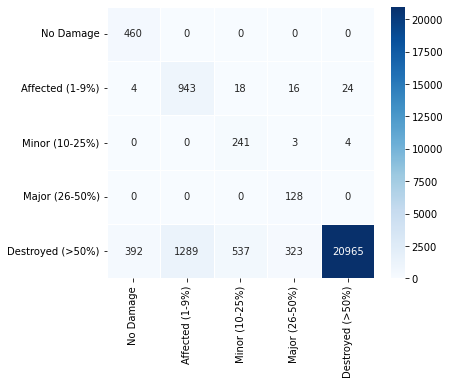

Confusion matrix № 2.1


In [71]:
print('Model with sample weights train')
y_train_preds = wxgb_clf.predict(X_train)
plot_conf_matrix(y_train, y_train_preds, damage_val_di)
print('Confusion matrix № 2.1')

Model with sample weights test


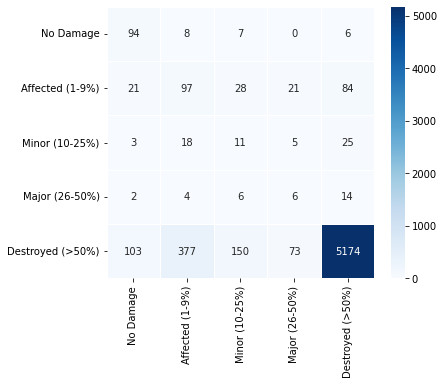

Confusion matrix № 2.2


In [72]:
print('Model with sample weights test')
y_pred = wxgb_clf.predict(X_test)
plot_conf_matrix(y_test, y_pred, damage_val_di)
print('Confusion matrix № 2.2')

Highlights:
1. The second model shows a higher Recall than the first one for all classes except Destroyed class. It can be seen on the main diagonals: 97/115 for No Damage class, 97/251 for Affected class, 11/62 for Minor class, 6/32 for Major class and 5174/5877 for Destroyed class 
2. The Recall is higher compared to the first model, but the second model still poorly predicts the Minor and Major classes.
3. With the second model we have more FP predictions for the first four classes, which is the price for the increased Recall 
4. As we increased  the number of FP predictions for first four classes => the Recall for the Destroyed class was decreased  

In [73]:
print_key_metrics(y_test, y_pred)


-------------------- Key Metrics --------------------

Accuracy: 0.85
Balanced Accuracy: 0.49

Micro Precision: 0.85
Micro Recall: 0.85
Micro F1-score: 0.85

Macro Precision: 0.34
Macro Recall: 0.49
Macro F1-score: 0.38

Weighted Precision: 0.92
Weighted Recall: 0.85
Weighted F1-score: 0.88


These key metrics summarize the above discussion regarding the model performance. Although Accuracy is high because of TP predictions of the largest Destroyed class, it is more informative to consider Macro Precision, Recall and F1 metrics and Balanced Accuracy.

## Under predict VS Over predict

Comparing Confusion matrices № 1.2 and № 2.2 for models with and without weights, we can conclude:

1. If we want the model to predict different classes, we need to use weights
2. If we want to avoid a lot of FP predictions, we need to use a model without weights.
3. Minor and Major classes are poorly predicted in both cases.

In real life, a trade-off between different types of errors can be found by understanding the desired outcome and by calculating the economic benefits of applying the model.

In our case,

1. In my opinion,  the most serious mistake on our side is to predict No Damage for an insurance client, while the building is destroyed in fact. This type of error can be seen on Confusion matrices № 2.2 at the intersection of the  Destroyed class row and the No Damage class column.
2. At the same time, we want to predict well the rest of classes (Affected, Minor, Major) because not every building completely destroyed in the fire.

## Feature importances with shap values

In [74]:
explainer = shap.TreeExplainer(wxgb_clf)
shap_values = explainer.shap_values(X_train)

/Users/artem/Documents/ML_projets/venvs/work_env/lib/python3.8/site-packages/xgboost/core.py:122: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



In [75]:
print(len(shap_values), len(shap_values[0])) # n_class; n_samples

5 25347


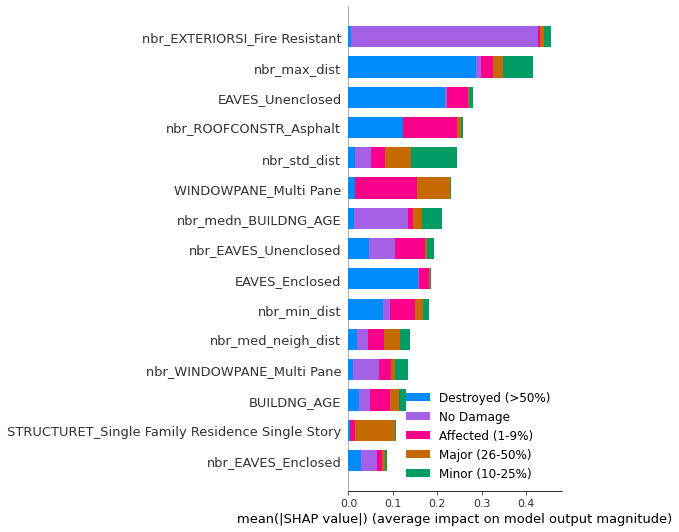

In [76]:
cl_names = list(damage_val_di.keys())[::-1]
shap.summary_plot(shap_values, 
                  features= tomodel_df.columns[1:],
                  class_names=cl_names,
                  max_display = 15)#, plot_type="bar")

Let's consider SHAP values of top 15 features on the training set: 
1. We can see that 10/15 features are our custom features with nbr prefix. That is a great result because we generate these features on our own and they are significant for the model.  
2. The most significant feature is nbr_EXTERIORSI_Fire_Resistant. We have seen before that this Exteriorsi category is the most common for No Damage class. Here we can see that neibours Exteriorsi with Fire_Resistant value lead to the predictions of the No Damage class, which is in a good agreement with common sense. 
3. The second top feature is nbr_max_dist and it influences model to predict Destroyed class. This leads us to expect that a closer distance results in a higher probability of a Destroyed class, but we will check this later.
4. Eaves unenclosed causes the model to predict Destroyed class and we have also seen this tendency earlier,  so that's great that the model has learned this relationship. 
5. Also, we have seen that Asphalt roof type is popular for No Damage class and on the plot above this feature is on the fourth place  
6. In general, we can conclude that the top features areare in line with what we saw in the feature analysis.

SHAP plot for No Damage


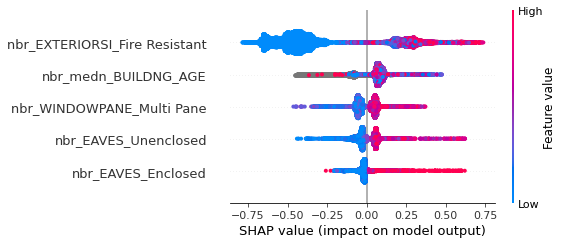

SHAP plot for Affected (1-9%)


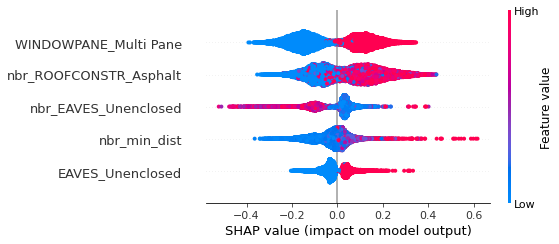

SHAP plot for Minor (10-25%)


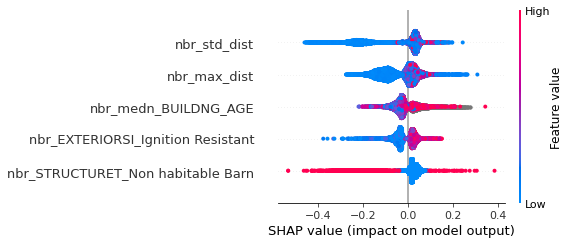

SHAP plot for Major (26-50%)


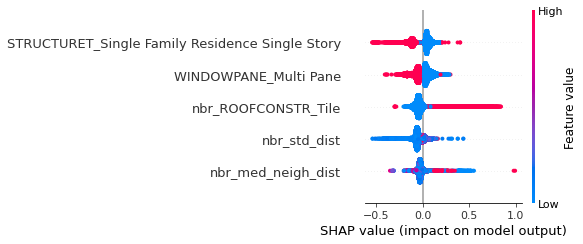

SHAP plot for Destroyed (>50%)


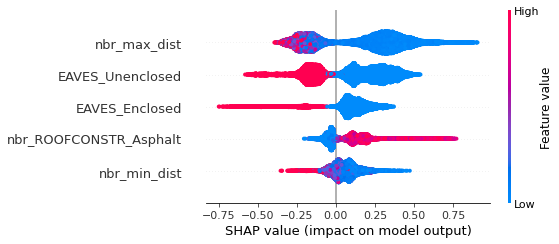

In [77]:
for i, cl_name in enumerate(cl_names):
    print(f'SHAP plot for {cl_name}')
    shap.summary_plot(shap_values[i], X_train, max_display = 5)
del cl_name

On these SHAP plots High (red) values push model to predict fixed class, for instance:
1. For No damage class, a higher value of nbr_EXTERIORSI_Fire_Resistant leads to higher probability of this class and lower values leads to lower probability. We have alreay seen this feature as top1 on the previous plot.  
2. Higher values of both types of EAVES (Enclosed and Unenclosed) lead to higher chance of No Damage and the opposite situation for Destroyed class. The opposite direction for these classes is fine, but it is strange that values with different meaning have the same result on target. This moment needs more research. Maybe the model is overfitting or something else might happen. 
3. With Multy Pane windows there is a higher chance to have Affected damage class - top1 feature for this class. 
4. A higher number of neighbors with Asphalt roof type leads to higher chances to have Affected damage. We have already seen this dependency before. Also, with a higher min distance we have a higher chance to have Affected damage class.  
5. A higher value of neighbor EAVES Unenclosed leads to lower chance of Affected damage class and this is in line with the common sense. At the same time, a higher value of EAVES Unenclosed leads to higher chance of Affected damage. This is a strange contradiction, it seems that the EAVES feature calculated by neighbors works better than the original one.

## Experiments with threshhold 

Unbalaced data (because of the volume of Destroyed class) leads to a high error. The reason for that:  when we train a model, it learns how to minimize the average error. To prevent this, we tried using class weights to force our model making the final decision in the tree nodes based on weighted samples. 

Now let's try to influence model results by adjusting probability thresholds. 

In [78]:
def select_thr_mlt_cl(X_train, y_train, X_test, y_test, model, class_n, score_name, quality):
    ''''''
    
    data = X_train
    target = [1 if c == class_n else 0 for c in y_train]
    
    pred_probs = model.predict_proba(data)[:,class_n]

    # calculate roc curves
    precision, recall, thresholds = precision_recall_curve(target, pred_probs)
    
    # locate the index of the largest precision
    if score_name == 'precision':
        # maximazing recall with fix precision quality:
        ix = np.argmax(recall[ precision>= quality])
        thr_ = thresholds[ix]
    
    elif score_name == 'recall':
        # maximazing precision  with fix recall quality:
        ix = np.argmax(precision[recall>= quality])
        thr_ = thresholds[ix]
    
    elif score_name == 'fscore':
        # choosing best f-score
        fscore = (2 * precision * recall) / (precision + recall)
        ix = np.argmax(fscore)
        thr_ = thresholds[ix]
    else:
        assert False, 'Error in score name..'
    
    # calc errors train: 
    print(f'Confusion matrix on train for class {class_n}')
    preds = [1 if c > thr_ else 0 for c in pred_probs]
    print(confusion_matrix(target, preds))
    
    # calc errors test: 
    test_data = X_test
    test_target = [1 if c == class_n else 0 for c in y_test]
    test_pred_probs = model.predict_proba(test_data)[:,class_n]
    
    print(f'Confusion matrix on test for class {class_n}')
    test_preds = [1 if c > thr_ else 0 for c in test_pred_probs]
    print(confusion_matrix(test_target, test_preds))
    
    return thresholds[ix]


def slct_many_thrsh(quality_di_, X_train, y_train, X_test, y_test, model):
    thrsh_di = {}
    for i in range(len(quality_di_)):
        score_name, score_qual = quality_di_.get(i)
        thr_ = select_thr_mlt_cl(
            X_train, y_train, X_test, y_test, model, i, score_name, score_qual)
        thrsh_di[i] = thr_
        print('-'*20,'\n')
    return thrsh_di


def shift_preds_df(model, X_test, thrsh_di):
    ''''''
    targets_preds_li = []
    for i, thr in thrsh_di.items():
        probs = model.predict_proba(X_test)[:,i]
        trgs = [1 if c > thr else 0 for c in probs]
        targets_preds_li.append(trgs)

    thr_res_df = pd.DataFrame(targets_preds_li).T
    thr_res_df['trsh_pred']= thr_res_df.apply(
        lambda x: 3 if x[3] == 1 else (2 if x[2] == 1 else np.argmax(x)) , axis=1)
    return thr_res_df

Here we try to adjust the probability threshold for each class to maximize the selected metric (Recall/Precision/Fscore) for each class. 
It is possible that one observation has more than one predicted class. To select only one class, we can add prioritization: Minor & Major classes have higher prioroty. 

In [79]:
quality_di = {
    0:['fscore', None],
    1:['fscore', None],
    2:['recall', 0.99],
    3:['recall', 0.99],
    4:['fscore', None]
}

mlt_thrsh_di = slct_many_thrsh(quality_di, X_train, y_train, X_test, y_test, wxgb_clf)

Confusion matrix on train for class 0
[[24838    49]
 [   28   432]]
Confusion matrix on test for class 0
[[6201   21]
 [  41   74]]
-------------------- 

Confusion matrix on train for class 1
[[24130   212]
 [  295   710]]
Confusion matrix on test for class 1
[[5999   87]
 [ 217   34]]
-------------------- 

Confusion matrix on train for class 2
[[23897  1202]
 [    3   245]]
Confusion matrix on test for class 2
[[5908  367]
 [  47   15]]
-------------------- 

Confusion matrix on train for class 3
[[25140    79]
 [    2   126]]
Confusion matrix on test for class 3
[[6278   27]
 [  27    5]]
-------------------- 

Confusion matrix on train for class 4
[[ 1278   563]
 [  327 23179]]
Confusion matrix on test for class 4
[[ 179  281]
 [ 104 5773]]
-------------------- 



In [80]:
print(mlt_thrsh_di)
mlt_shift_df = shift_preds_df(wxgb_clf, X_test, mlt_thrsh_di)
mlt_shift_df.head(3)

{0: 0.49882576, 1: 0.41220132, 2: 0.23432651, 3: 0.3873854, 4: 0.14118464}


,0,1,2,3,4,trsh_pred
0,0,0,0,0,1,4
1,0,0,0,0,1,4
2,0,0,0,0,1,4


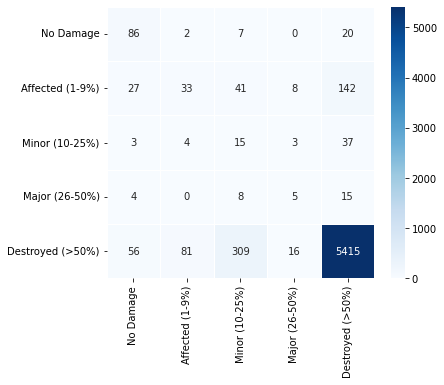

In [81]:
plot_conf_matrix(y_test, mlt_shift_df.trsh_pred, damage_val_di)

In [82]:
print_key_metrics(y_test, mlt_shift_df.trsh_pred)


-------------------- Key Metrics --------------------

Accuracy: 0.88
Balanced Accuracy: 0.44

Micro Precision: 0.88
Micro Recall: 0.88
Micro F1-score: 0.88

Macro Precision: 0.38
Macro Recall: 0.44
Macro F1-score: 0.39

Weighted Precision: 0.91
Weighted Recall: 0.88
Weighted F1-score: 0.89


In [83]:
del X_train, X_test, y_train, y_test

It can be seen that the number of correctly predicted Minor class slightly incresed from 11 to 15. However, the number of FP values also increased for this class.  

Now let's try to train One VS Rest model and perform the same steps to find threshholds.

# Train One VS  Rest model

## Helper functions

In [84]:
def replace_classes_to_binary(x, class_to_predict:int): 
    return 1 if x == class_to_predict else 0

def train_ovr_model(input_df, train_ind_, test_ind_, class_num:int, nest = 1000):
    ''''''
    df = input_df.copy()
    df.DAMAGE_CLASS = df.DAMAGE_CLASS.apply(
        lambda x: replace_classes_to_binary(x, class_num))
    
    # Train
    X_train = df[df.index.isin(train_ind_)].reset_index(drop= True)
    y_train = X_train.DAMAGE_CLASS
    X_train.drop(columns = ['DAMAGE_CLASS'], inplace= True)
    # Test
    X_test = df[df.index.isin(test_ind_)].reset_index(drop= True)
    y_test = X_test.DAMAGE_CLASS
    X_test.drop(columns = ['DAMAGE_CLASS'], inplace= True)
    # Class Dist:
    print(pd.Series(y_train).value_counts())
    
    sample_weights = compute_sample_weight(
        class_weight='balanced',
        y=y_train
    )
    
    print(f'Class ratio:{set(sample_weights)}')
    print(f'Train model for class number {class_num} VS rest')
    
    xgb_clf = xgb.XGBClassifier(
                                learning_rate=0.05,
                                n_estimators = nest,
                                max_depth = 5,
                                seed=42)

    xgb_clf.fit(X_train, 
                y_train,
                sample_weight=sample_weights,
               )
    
    return xgb_clf, (X_train, y_train), (X_test, y_test)


def train_model_for_each_class(df, train_ind, test_ind, class_num, ntrees=100):
    ''''''
    train_ind = X_train.index
    test_ind = X_test.index

    model_di = {}
    train_data_di = {}
    test_data_di = {}

    for class_num in tqdm(range(5)):
        model_di[class_num],train_data_di[class_num],test_data_di[class_num] = train_ovr_model(
            df, train_ind, test_ind, class_num, ntrees)
    assert len(model_di) == 5, 'Else error'
    return model_di, train_data_di, test_data_di


def creat_preds_df(model_di, X_test):
    ''''''
    model_preds_li = []
    for i in range(5):
        model_preds_li.append(model_di[i].predict_proba(X_test)[:,1])
    model_preds_li.append(np.array(model_preds_li).argmax(axis=0)) # select class with max prob over 5 probs

    df = pd.DataFrame(model_preds_li).T
    df.columns = [f'model_{i}' for i in range(5)] + ['max_prob_class']
    df.head()
    return df

In [85]:
# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    tomodel_df[tomodel_df.columns[1:]], tomodel_df.DAMAGE_CLASS,
    stratify=tomodel_df.DAMAGE_CLASS, 
    test_size=0.2, 
    random_state= 1)

In [86]:
# Train 5 models for each class VS rest samples:
train_ind = X_train.index
test_ind = X_test.index
class_num = 5

model_di, train_data_di, test_data_di = train_model_for_each_class(
    tomodel_df, train_ind, test_ind, class_num, ntrees=100)

  0%|          | 0/5 [00:00<?, ?it/s]

0    24887
1      460
Name: DAMAGE_CLASS, dtype: int64
Class ratio:{0.5092417728131153, 27.55108695652174}
Train model for class number 0 VS rest
0    24342
1     1005
Name: DAMAGE_CLASS, dtype: int64
Class ratio:{0.5206433325117081, 12.61044776119403}
Train model for class number 1 VS rest
0    25099
1      248
Name: DAMAGE_CLASS, dtype: int64
Class ratio:{0.5049404358739392, 51.10282258064516}
Train model for class number 2 VS rest
0    25219
1      128
Name: DAMAGE_CLASS, dtype: int64
Class ratio:{0.5025377691423133, 99.01171875}
Train model for class number 3 VS rest
1    23506
0     1841
Name: DAMAGE_CLASS, dtype: int64
Class ratio:{0.5391602144133413, 6.88403041825095}
Train model for class number 4 VS rest


In [87]:
# Creating prediciton DF and choosing max prob over all 5 models predictions
preds_df = creat_preds_df(model_di, X_test)
print(preds_df.shape)
preds_df.head()

(6337, 6)


,model_0,model_1,model_2,model_3,model_4,max_prob_class
0,0.004141,0.132253,0.049417,0.038741,0.881954,4.0
1,0.003488,0.066387,0.012595,0.015624,0.962263,4.0
2,0.003287,0.050767,0.012303,0.030063,0.948194,4.0
3,0.004036,0.091578,0.044738,0.033514,0.923455,4.0
4,0.080387,0.819848,0.610855,0.097436,0.243074,1.0


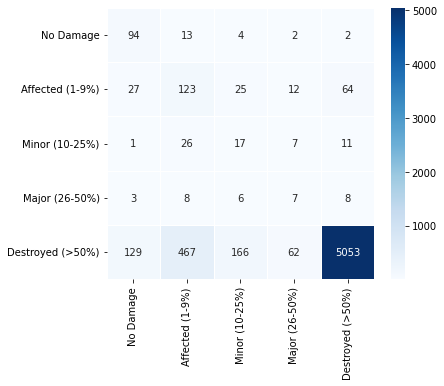

In [88]:
plot_conf_matrix(y_test, preds_df.max_prob_class, damage_val_di)

Using 5 models we received more correctly predicted samples from Major and Minor classes

## Choose a  threshold

In [89]:
def select_bst_thrsh(train_data_di_, test_data_di_, model_n_, score_name, quality):
    
    ''''''
    model = model_di[model_n_]
    data = train_data_di_[model_n_][0]
    target = train_data_di_[model_n_][1]
    
    pred_probs = model.predict_proba(data)[:,1]

    # calculate roc curves
    precision, recall, thresholds = precision_recall_curve(target, pred_probs)
    
    # locate the index of the largest precision
    if score_name == 'precision':
        # maximazing recall with fix precision quality:
        ix = np.argmax(recall[ precision>= quality])
        thr_ = thresholds[ix]
    
    elif score_name == 'recall':
        # maximazing precision  with fix recall quality:
        ix = np.argmax(precision[recall>= quality])
        thr_ = thresholds[ix]
    
    elif score_name == 'fscore':
        # choosing best f-score
        fscore = (2 * precision * recall) / (precision + recall)
        ix = np.argmax(fscore)
        thr_ = thresholds[ix]
    else:
        assert False, 'Error in score name..'
    
    # calc errors train: 
    print(f'Confusion matrix on train for class {model_n_}')
    preds = [1 if c > thr_ else 0 for c in pred_probs]
    print(confusion_matrix(target, preds))
    
    # calc errors test: 
    test_data = test_data_di_[model_n_][0]
    test_target = test_data_di_[model_n_][1]
    test_pred_probs = model.predict_proba(test_data)[:,1]
    print(f'Confusion matrix on test for class {model_n_}')
    test_preds = [1 if c > thr_ else 0 for c in test_pred_probs]
    print(confusion_matrix(test_target, test_preds))
    
    return thresholds[ix]

def ovr_shift_preds_df(model_di, X_test, thrsh_di):
    ''''''
    targets_preds_li = []
    for i, thr in thrsh_di.items():
        probs = model_di[i].predict_proba(X_test)[:,1]
        trgs = [1 if c > thr else 0 for c in probs]
        targets_preds_li.append(trgs)

    thr_res_df = pd.DataFrame(targets_preds_li).T
    thr_res_df['trsh_pred']= thr_res_df.apply(
        lambda x: 3 if x[3] == 1 else (2 if x[2] == 1 else np.argmax(x)) , axis=1)
    return thr_res_df

def create_thrsh_di(train_data_di, test_data_di, quality_di):
    ''''''
    thrsh_di = {}
    for i in range(5):
        score_name, score_qual = quality_di.get(i)
        thrsh_di[i] = select_bst_thrsh(train_data_di, test_data_di, i, score_name, score_qual)
    return thrsh_di

In [90]:
quality_di = {
    0:['fscore', None],
    1:['recall', 0.9],
    2:['recall', 0.95],
    3:['recall', 0.99],
    4:['fscore', None]
}

In [91]:
thrsh_di = create_thrsh_di(train_data_di, test_data_di, quality_di)

Confusion matrix on train for class 0
[[24822    65]
 [   77   383]]
Confusion matrix on test for class 0
[[6197   25]
 [  31   84]]
Confusion matrix on train for class 1
[[21190  3152]
 [  101   904]]
Confusion matrix on test for class 1
[[5281  805]
 [  78  173]]
Confusion matrix on train for class 2
[[23821  1278]
 [   13   235]]
Confusion matrix on test for class 2
[[5936  339]
 [  29   33]]
Confusion matrix on train for class 3
[[24949   270]
 [    2   126]]
Confusion matrix on test for class 3
[[6229   76]
 [  24    8]]
Confusion matrix on train for class 4
[[  849   992]
 [  330 23176]]
Confusion matrix on test for class 4
[[ 185  275]
 [  96 5781]]


In [92]:
ovr_thr_df = ovr_shift_preds_df(model_di, X_test, thrsh_di)
print(ovr_thr_df.shape)
ovr_thr_df.head(3)

(6337, 6)


,0,1,2,3,4,trsh_pred
0,0,0,0,0,1,4
1,0,0,0,0,1,4
2,0,0,0,0,1,4


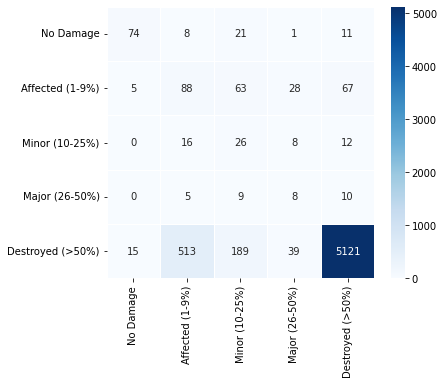

In [93]:
plot_conf_matrix(y_test, ovr_thr_df.trsh_pred, damage_val_di)

With the selected thresholds we can detect correctly 26 Minor class samples and 8 Major class samples. the FP rate is lower for these classes in comparison with the prevous attempts. Unfortunately, we have a lower perfomance for No Damage and Affected classes. 

In order not to sacrifice the quality of the model, we need to try to come up with features that would better distinguish the Minor and Major classes.

# Conclusion and the next steps

As a result, we:

    1. Made a deep research into the data  
    2. Cleaned the data and generated new features    
    3. Trained two different models   
    4. Analized and interpreted the results  
    5. Adjusted probability thresholds to change the model results

Next steps: 

    1. We can see that our custom neigbor features are relevant and extremely useful. So we can try to adjust number of neighbors and improve these features
    2. Add some external information from open sources about wildfires over CA  
    3. Calculate distances to some specific buildings or locations, for instance: distance to fire departments, lakes, forests, etc  
    4. Try to find information about house prices. For example, probably there is a correlation between the price of house and regularity of cleaning and watering 
    5. Get information about abandoned houses and their locations
    6. Understand what is ASSESSEDIM...
    7. Find more information about vegetation around buildings  
    8. Technical improvements (cross validation, feature selection, excluding not informative feature, reducing dim of features with PCA, etc)
    9. Understand and resolve some of the contradictions in the features mentioned in the model interpretation sections.
    10.Try graph techniques to better analyze behaviour among neighbors  